# Organise dataset for interface

In [1]:
import os
import shutil
from collections import defaultdict

# Define the required angles
required_angles = {'LF', 'RF', 'LB', 'AH', 'AS'}

# Path to the folder containing images
image_folder = 'images'
output_folder = 'organised_samples'

# Collect images by id and angle
images_by_id = defaultdict(dict)
for filename in os.listdir(image_folder):
    if filename.endswith('.jpg'):
        parts = filename.split('-')
        if len(parts) >= 4:
            img_id = parts[1]
            angle = parts[3]
            angle = angle.split('.')[0]  # Remove .jpg
            images_by_id[img_id][angle] = filename

# Filter ids with all required angles
valid_ids = [img_id for img_id, angles in images_by_id.items() if required_angles.issubset(angles.keys())]

# Take 10 samples
sample_ids = valid_ids[:10]

# Organise images into folders
os.makedirs(output_folder, exist_ok=True)
for img_id in sample_ids:
    id_folder = os.path.join(output_folder, img_id)
    os.makedirs(id_folder, exist_ok=True)
    for angle in required_angles:
        src = os.path.join(image_folder, images_by_id[img_id][angle])
        dst = os.path.join(id_folder, images_by_id[img_id][angle])
        shutil.copy(src, dst)

In [13]:
import os
import shutil
import random
from PIL import Image

# Paths
images_dir = 'images'
labels_dir = 'images_label'
output_dir = './yolo_dataset'
os.makedirs(f'{output_dir}/images/train', exist_ok=True)
os.makedirs(f'{output_dir}/images/val', exist_ok=True)
os.makedirs(f'{output_dir}/labels/train', exist_ok=True)
os.makedirs(f'{output_dir}/labels/val', exist_ok=True)

# Helper to check if text is ISO code
def is_iso_code(text):
    # Condition lenght is 4
    if len(text) != 4:
        return False
    # Check if it starts with two digits and end with a letter then a digit
    #if not (text[0:2].isdigit() and text[2:4].isalpha() and text[3].isdigit()):
    #    return False
    
    return True  # adjust rules if needed

# Helper to check if text is owner code
def is_owner_code(text):
    # Condition length is 4
    if len(text) != 11:
        return False
    # Check if it starts with 4 letter and ends with 7 digit
    if not (text[0:4].isalpha() and text[4:11].isdigit()):
        return False
    
    return True  # adjust rules if needed

# Get all valid files
all_files = []
for filename in os.listdir(labels_dir):
    label_path = os.path.join(labels_dir, filename)
    with open(label_path, 'r') as f:
        lines = f.readlines()
    if 1 <= len(lines) <= 2:
        all_files.append(filename.replace('.txt', ''))

# Shuffle and split
random.shuffle(all_files)
split_idx = int(0.8 * len(all_files))
train_files = all_files[:split_idx]
val_files = all_files[split_idx:]

# Function to convert and copy files
def process_files(file_list, split):
    for file_id in file_list:
        image_path = os.path.join(images_dir, file_id + '.jpg')
        label_path = os.path.join(labels_dir, file_id + '.txt')

        # Load image size
        img = Image.open(image_path)
        img_w, img_h = img.size

        # Output label path
        yolo_label_lines = []
        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split(',')
                if len(parts) != 5:
                    continue
                x_min, y_min, x_max, y_max, text = parts
                x_min, y_min, x_max, y_max = map(int, [x_min, y_min, x_max, y_max])
                x_center = (x_min + x_max) / 2 / img_w
                y_center = (y_min + y_max) / 2 / img_h
                width = (x_max - x_min) / img_w
                height = (y_max - y_min) / img_h

                # Determine class
                if is_owner_code(text):
                    class_id = 0
                elif is_iso_code(text):
                    class_id = 1
                else:
                    continue
                yolo_line = f"{class_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}"
                yolo_label_lines.append(yolo_line)

        # Save converted label
        with open(f"{output_dir}/labels/{split}/{file_id}.txt", 'w') as f:
            f.write('\n'.join(yolo_label_lines))

        # Copy image
        shutil.copy(image_path, f"{output_dir}/images/{split}/{file_id}.jpg")

# Process all
process_files(train_files, 'train')
process_files(val_files, 'val')


In [34]:
# Save separatly the non processed files
non_processed_files = set([name.replace(".jpg","") for name in os.listdir(images_dir)]) - set(train_files + val_files)

#  Copy non-processed images to a separate folder
non_processed_dir = os.path.join(output_dir, 'images', 'non_processed')
os.makedirs(non_processed_dir, exist_ok=True)
for file_id in non_processed_files:
    print(f"Copying non-processed image: {file_id}")
    src_image_path = os.path.join(images_dir, file_id + ".jpg")
    if os.path.exists(src_image_path):
        shutil.copy(src_image_path, non_processed_dir)

Copying non-processed image: 1-141332001-OCR-LF-C01
Copying non-processed image: 1-124544001-OCR-LB-C02
Copying non-processed image: 1-155800001-OCR-LF-C01
Copying non-processed image: 1-145552001-OCR-RF-D01
Copying non-processed image: 1-141210001-OCR-RF-D01
Copying non-processed image: 1-145322001-OCR-RF-D01
Copying non-processed image: 1-123809001-OCR-RF-D01
Copying non-processed image: 1-132924001-OCR-LF-C01
Copying non-processed image: 1-142900001-OCR-RF-D01
Copying non-processed image: 1-131526001-OCR-LF-C01
Copying non-processed image: 1-141723001-OCR-RF-D01
Copying non-processed image: 1-155800001-OCR-RF-D01
Copying non-processed image: 1-130159001-OCR-AS-B01
Copying non-processed image: 1-123822001-OCR-RF-D01
Copying non-processed image: 1-143546001-OCR-RF-D01
Copying non-processed image: 1-130417001-OCR-RF-D01
Copying non-processed image: 1-124544001-OCR-RF-D01
Copying non-processed image: 1-152119001-OCR-LF-C01
Copying non-processed image: 1-145251001-OCR-RF-D01
Copying non-

In [31]:
print(len(train_files), len(val_files))
print(f"Processed {len(train_files)} training files and {len(val_files)} validation files.")
print(len(os.listdir(images_dir)))
print(len(non_processed_files))
print(len(train_files))

2219 555
Processed 2219 training files and 555 validation files.
3003
229
2219


In [10]:
import os
import cv2
import matplotlib.pyplot as plt

image_dir = "organised_samples"
labeled_image_dir = "labeled_samples"
label_dir = "images_label"
# Create labeled image directory
os.makedirs(labeled_image_dir, exist_ok=True)

# Process each image and its corresponding label
for img_id in os.listdir(image_dir):
    for image in os.listdir(os.path.join(image_dir, img_id)):
        image_path = os.path.join(image_dir, img_id, image)
        # remove the .jpg extension from the image name to match the label file
        image_no_ext = os.path.splitext(image)[0]
        label_path = os.path.join(label_dir, image_no_ext + '.txt')
        print(f"Processing {image_path} with label {label_path}")
        
        if os.path.exists(label_path):

            # Create the labeled image
            labeled_image = cv2.imread(image_path)
            with open(label_path, 'r') as f:
                lines = f.readlines()
                label_text = ""
                for line in lines:
                    parts = line.strip().split(',')
                    if len(parts) != 5:
                        continue
                    x_min, y_min, x_max, y_max, text = parts
                    x_min, y_min, x_max, y_max = map(int, [x_min, y_min, x_max, y_max])
                    
                    # Draw rectangle and label on the image
                    cv2.rectangle(labeled_image, (x_min, y_min), (x_max, y_max), (255, 255, 0), 2)
                    cv2.putText(labeled_image, text, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.75, (255, 255, 0), 2)
                    
                    # Store the label and the bounding box in text file
                    if len(text) == 11:
                        class_id = 0
                    elif len(text) == 4:
                        class_id = 1
                    else:
                        class_id = -1
                    label_text += f"{class_id} {text} {x_min} {y_min} {x_max} {y_max}\n"

            # Create a directory of img_id if it doesn't exist
            os.makedirs(os.path.join(labeled_image_dir, img_id), exist_ok=True)
            # Save the label text file
            label_file_path = os.path.join(labeled_image_dir, img_id, f"{image_no_ext}.txt")
            with open(label_file_path, 'w') as label_file:
                label_file.write(label_text.strip())

            # Ensure the output filename has a valid image extension (e.g., .jpg)
            labeled_image_save_path = os.path.join(labeled_image_dir, img_id, f"{image_no_ext}.jpg")
            cv2.imwrite(labeled_image_save_path, labeled_image)
# Display a message indicating completion
print("Labeled images have been saved to:", labeled_image_dir)

Processing organised_samples\124126001\1-124126001-OCR-AH-A01.jpg with label images_label\1-124126001-OCR-AH-A01.txt
Processing organised_samples\124126001\1-124126001-OCR-AS-B01.jpg with label images_label\1-124126001-OCR-AS-B01.txt
Processing organised_samples\124126001\1-124126001-OCR-LB-C02.jpg with label images_label\1-124126001-OCR-LB-C02.txt
Processing organised_samples\124126001\1-124126001-OCR-LF-C01.jpg with label images_label\1-124126001-OCR-LF-C01.txt
Processing organised_samples\124126001\1-124126001-OCR-RF-D01.jpg with label images_label\1-124126001-OCR-RF-D01.txt
Processing organised_samples\124835001\1-124835001-OCR-AH-A01.jpg with label images_label\1-124835001-OCR-AH-A01.txt
Processing organised_samples\124835001\1-124835001-OCR-AS-B01.jpg with label images_label\1-124835001-OCR-AS-B01.txt
Processing organised_samples\124835001\1-124835001-OCR-LB-C02.jpg with label images_label\1-124835001-OCR-LB-C02.txt
Processing organised_samples\124835001\1-124835001-OCR-LF-C01.jp

# 

In [ ]:
# Crop the images based on the labels
cropped_images_dir = "label_cropped"
image_dir = "labeled_samples"
os.makedirs(cropped_images_dir, exist_ok=True)
# Process each labeled image and crop based on the labels
for img_id in os.listdir(labeled_image_dir):
    for image in os.listdir(os.path.join(labeled_image_dir, img_id)):
        labeled_image_path = os.path.join(image_dir, image)
        # Only process image files
        if not image.lower().endswith(('.jpg', '.jpeg', '.png')):
            continue
        label_path = os.path.join(labeled_image_dir, img_id, os.path.splitext(image)[0] + '.txt')
        
        if os.path.exists(label_path):
            img = cv2.imread(labeled_image_path)
            if img is None:
                print(f"Warning: Could not read image {labeled_image_path}")
                continue
            with open(label_path, 'r') as f:
                lines = f.readlines()
                for line in lines:
                    parts = line.strip().split()
                    if len(parts) < 6:
                        continue
                    class_id = parts[0]
                    x_min = int(parts[2])
                    y_min = int(parts[3])
                    x_max = int(parts[4])
                    y_max = int(parts[5])
                    
                    cropped_img = img[y_min:y_max, x_min:x_max]                    
                    cropped_image_name = f"{img_id}_{class_id}.jpg"
                    cropped_image_path = os.path.join(cropped_images_dir, cropped_image_name)
                    cv2.imwrite(cropped_image_path, cropped_img)

In [19]:
import os
import cv2

def crop_labeled_regions(image_dir = 'images', labeled_image_dir="labeled_samples"):
    """
    For each id in labeled_samples, create subfolders for each labeled image.
    In each subfolder, save cropped regions with class_id in the filename.
    """
    for img_id in os.listdir(labeled_image_dir):
        id_folder = os.path.join(labeled_image_dir, img_id)
        if not os.path.isdir(id_folder):
            continue
        for image in os.listdir(id_folder):
            if not image.lower().endswith(('.jpg', '.jpeg', '.png')):
                continue
            image_no_ext = os.path.splitext(image)[0]
            label_path = os.path.join(id_folder, image_no_ext + '.txt')
            labeled_image_path = os.path.join(id_folder, image)
            image_path = os.path.join(image_dir, image)
            if not os.path.exists(label_path):
                continue
            img = cv2.imread(image_path)
            if img is None:
                print(f"Warning: Could not read image {image_path}")
                continue
            # Create output subfolder for this image
            out_subfolder = os.path.join(labeled_image_dir, img_id, image_no_ext)
            os.makedirs(out_subfolder, exist_ok=True)
            with open(label_path, 'r') as f:
                lines = f.readlines()
                for idx, line in enumerate(lines):
                    parts = line.strip().split()
                    if len(parts) < 6:
                        continue
                    class_id = parts[0]
                    x_min = int(parts[2])
                    y_min = int(parts[3])
                    x_max = int(parts[4])
                    y_max = int(parts[5])
                    cropped_img = img[y_min:y_max, x_min:x_max]
                    crop_name = f"{image_no_ext}_crop_{idx}_class{class_id}.jpg"
                    crop_path = os.path.join(out_subfolder, crop_name)
                    cv2.imwrite(crop_path, cropped_img)
    print(f"All crops saved in: {labeled_image_dir}")

# Example usage:
crop_labeled_regions(image_dir = 'images', labeled_image_dir="labeled_samples")

All crops saved in: labeled_samples


# Cropping function and image reconstitution

In [24]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def adaptive_threshold_and_filter(image_path, min_area=250, window_size=31, window_constant=-1, kernel_size=3, op_iterations=1):

    inputImage = cv2.imread(image_path)
    inputCopy = inputImage.copy()

    # Convert BGR to grayscale:
    grayscaleImage = cv2.cvtColor(inputImage, cv2.COLOR_BGR2GRAY)

    # Set the adaptive thresholding (gaussian) parameters:
    # Apply the threshold:
    binaryImage = cv2.adaptiveThreshold(
        grayscaleImage, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
        cv2.THRESH_BINARY, window_size, window_constant
    )

    # Invert if mean value is high (background is white)
    mean_val = np.mean(binaryImage)
    if mean_val > 100:
        binaryImage = cv2.bitwise_not(binaryImage)
    print(f"Mean value of the binary image: {mean_val}")


    # Perform an area filter on the binary blobs:
    componentsNumber, labeledImage, componentStats, componentCentroids = \
        cv2.connectedComponentsWithStats(binaryImage, connectivity=4)

    # Get the indices/labels of the remaining components based on the area stat
    remainingComponentLabels = [i for i in range(1, componentsNumber) if componentStats[i][4] >= min_area]

    # Filter the labeled pixels based on the remaining labels
    filteredImage = np.where(np.isin(labeledImage, remainingComponentLabels), 255, 0).astype('uint8')


    # Morphological closing:
    maxKernel = cv2.getStructuringElement(cv2.MORPH_RECT, (kernel_size, kernel_size))
    closingImage = cv2.morphologyEx(filteredImage, cv2.MORPH_CLOSE, maxKernel, None, None, op_iterations, cv2.BORDER_REFLECT101)


    # Get each bounding box
    contours, hierarchy = cv2.findContours(closingImage, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)
    contours_poly = [None] * len(contours)
    boundRect = []

    for i, c in enumerate(contours):
        if hierarchy[0][i][3] == -1:
            contours_poly[i] = cv2.approxPolyDP(c, 3, True)
            boundRect.append(cv2.boundingRect(contours_poly[i]))

    # Draw the bounding boxes on the (copied) input image:
    for i in range(len(boundRect)):
        if boundRect[i][2] < 10 or boundRect[i][3] < 10:
            continue
        color = (0, 255, 0)
        cv2.rectangle(inputCopy, (int(boundRect[i][0]), int(boundRect[i][1])),
                      (int(boundRect[i][0] + boundRect[i][2]), int(boundRect[i][1] + boundRect[i][3])), color, 2)

    # Visualize the bounding boxes
    plt.imshow(cv2.cvtColor(inputCopy, cv2.COLOR_BGR2RGB))
    plt.title("Bounding Boxes Detected")
    plt.axis('off')
    plt.show()

    return closingImage, boundRect

def reconstitute_characters_with_padding(closingImage, boundRect, space=10, top_pad=5, bottom_pad=5, left_pad=2, right_pad=2, save_path="reconstituted_image.png"):
    """
    Crops character images from bounding rectangles, pads and concatenates them with black borders.
    Returns the final padded image.
    """
    import numpy as np
    import cv2
    import matplotlib.pyplot as plt

    
    # Condition to check if the image is vertical
    if closingImage.shape[0] > closingImage.shape[1]:
        print("The image is vertical, resizing to horizontal orientation.")
    
        # Crop character images (reverse order as in your code)
        cropped_images = []
        for i in range(len(boundRect)-1, -1, -1):
            x, y, w, h = boundRect[i]
            croppedImg = closingImage[y:y + h, x:x + w]
            cropped_images.append(croppedImg)

        # Find the maximum height among all cropped images
        max_height = max(img.shape[0] for img in cropped_images)

        # Resize all images to the same height (pad with black if needed)
        cropped_images_padded = []
        for img in cropped_images:
            h, w = img.shape
            if h < max_height:
                pad = np.zeros((max_height - h, w), dtype=img.dtype)
                img_padded = np.vstack([img, pad])
            else:
                img_padded = img
            cropped_images_padded.append(img_padded)

        # Create black space image
        black_space = np.zeros((max_height, space), dtype=np.uint8)

        # Concatenate images with black space in between
        result = cropped_images_padded[0]
        for img in cropped_images_padded[1:]:
            result = np.hstack([result, black_space, img])

        # Add black space at the top, bottom, left, and right
        result_padded = np.pad(
            result,
            pad_width=((top_pad, bottom_pad), (left_pad, right_pad)),
            mode='constant',
            constant_values=0
        )

        # Show the result
        plt.imshow(result_padded, cmap='gray')
        plt.axis('off')
        plt.title('Reconstituted Image with Black Borders and Padding')
        plt.show()

        # Save the reconstituted image with borders and padding
        cv2.imwrite(save_path, result_padded)
        print(f"Reconstituted image saved as '{save_path}'")

        return result_padded
    
    else:
        print("The image is horizontal")
        # Show the original closing image
        plt.imshow(closingImage, cmap='gray')
        plt.axis('off')
        plt.title('Original Closing Image')
        plt.show()
        
        # Save the original closing image
        cv2.imwrite(save_path, closingImage)
        print(f"Original closing image saved as '{save_path}'")
        return closingImage

Mean value of the binary image: 69.3882817243473


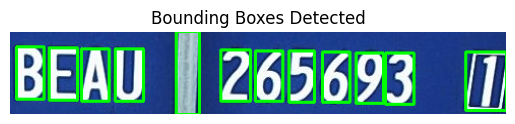

The image is horizontal


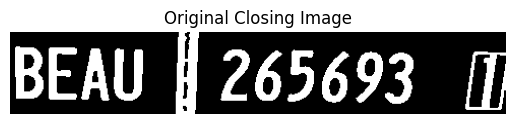

Original closing image saved as 'labeled_samples\124126001\1-124126001-OCR-AH-A01\1-124126001-OCR-AH-A01_reconst_0_class0.jpg'
Saved: labeled_samples\124126001\1-124126001-OCR-AH-A01\1-124126001-OCR-AH-A01_reconst_0_class0.jpg
Mean value of the binary image: 76.9973743435859


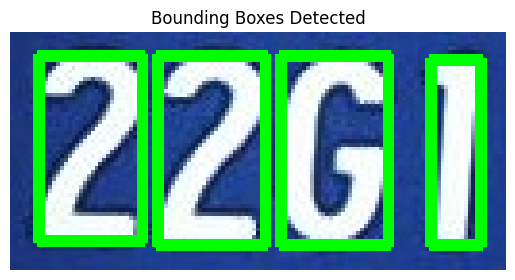

The image is horizontal


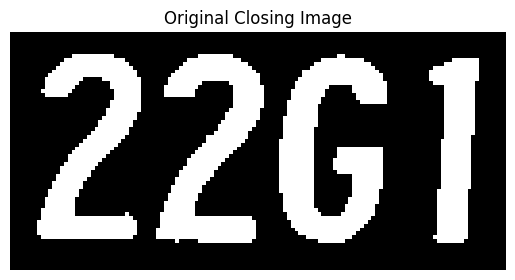

Original closing image saved as 'labeled_samples\124126001\1-124126001-OCR-AH-A01\1-124126001-OCR-AH-A01_reconst_1_class1.jpg'
Saved: labeled_samples\124126001\1-124126001-OCR-AH-A01\1-124126001-OCR-AH-A01_reconst_1_class1.jpg
Mean value of the binary image: 68.08656294200848


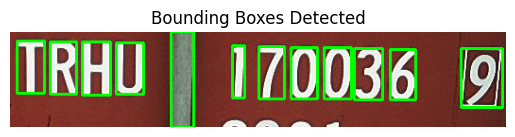

The image is horizontal


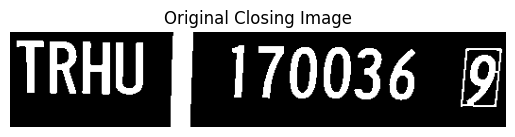

Original closing image saved as 'labeled_samples\124126001\1-124126001-OCR-AS-B01\1-124126001-OCR-AS-B01_reconst_0_class0.jpg'
Saved: labeled_samples\124126001\1-124126001-OCR-AS-B01\1-124126001-OCR-AS-B01_reconst_0_class0.jpg
Mean value of the binary image: 70.90745585349902


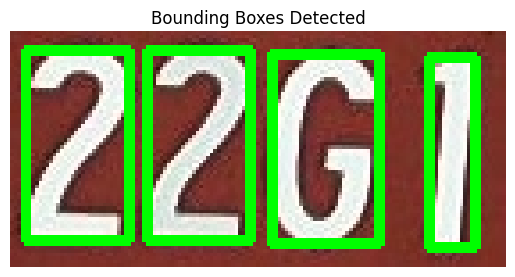

The image is horizontal


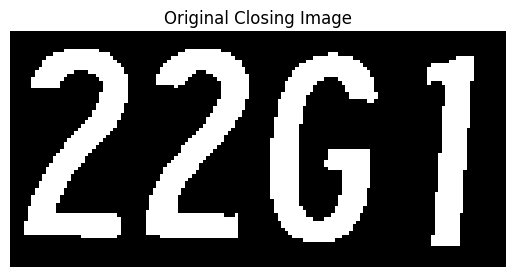

Original closing image saved as 'labeled_samples\124126001\1-124126001-OCR-AS-B01\1-124126001-OCR-AS-B01_reconst_1_class1.jpg'
Saved: labeled_samples\124126001\1-124126001-OCR-AS-B01\1-124126001-OCR-AS-B01_reconst_1_class1.jpg
Mean value of the binary image: 66.63062888198758


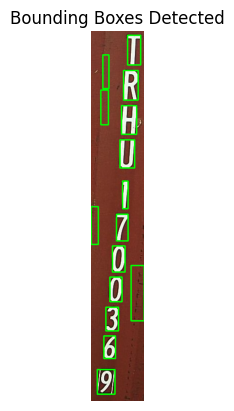

The image is vertical, resizing to horizontal orientation.


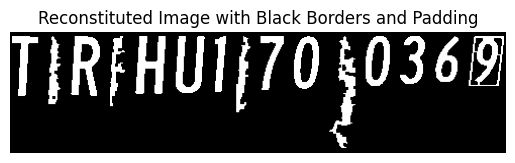

Reconstituted image saved as 'labeled_samples\124126001\1-124126001-OCR-LB-C02\1-124126001-OCR-LB-C02_reconst_0_class0.jpg'
Saved: labeled_samples\124126001\1-124126001-OCR-LB-C02\1-124126001-OCR-LB-C02_reconst_0_class0.jpg
Mean value of the binary image: 67.39229583975347


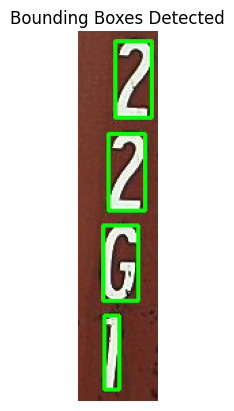

The image is vertical, resizing to horizontal orientation.


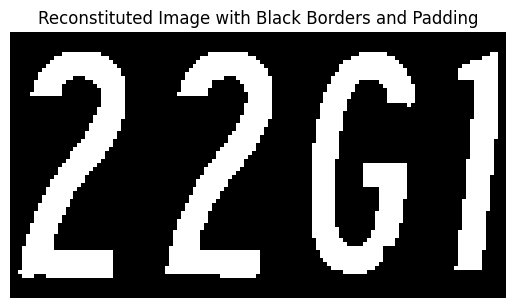

Reconstituted image saved as 'labeled_samples\124126001\1-124126001-OCR-LB-C02\1-124126001-OCR-LB-C02_reconst_1_class1.jpg'
Saved: labeled_samples\124126001\1-124126001-OCR-LB-C02\1-124126001-OCR-LB-C02_reconst_1_class1.jpg
Mean value of the binary image: 57.70632737276479


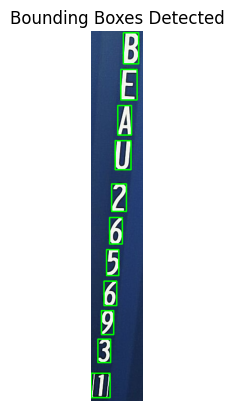

The image is vertical, resizing to horizontal orientation.


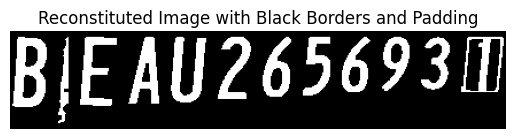

Reconstituted image saved as 'labeled_samples\124126001\1-124126001-OCR-LF-C01\1-124126001-OCR-LF-C01_reconst_0_class0.jpg'
Saved: labeled_samples\124126001\1-124126001-OCR-LF-C01\1-124126001-OCR-LF-C01_reconst_0_class0.jpg
Mean value of the binary image: 67.69090909090909


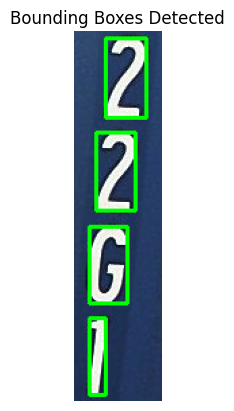

The image is vertical, resizing to horizontal orientation.


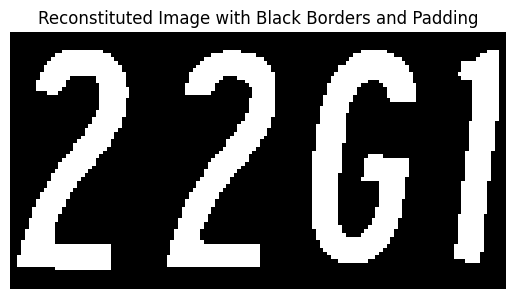

Reconstituted image saved as 'labeled_samples\124126001\1-124126001-OCR-LF-C01\1-124126001-OCR-LF-C01_reconst_1_class1.jpg'
Saved: labeled_samples\124126001\1-124126001-OCR-LF-C01\1-124126001-OCR-LF-C01_reconst_1_class1.jpg
Mean value of the binary image: 51.60247252747253


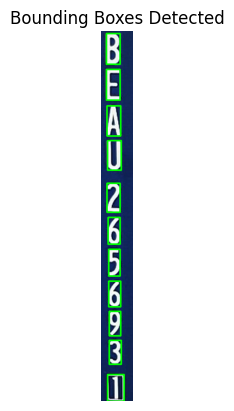

The image is vertical, resizing to horizontal orientation.


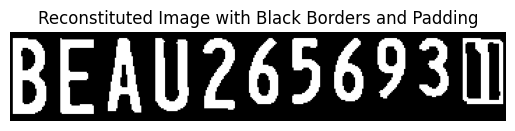

Reconstituted image saved as 'labeled_samples\124126001\1-124126001-OCR-RF-D01\1-124126001-OCR-RF-D01_reconst_0_class0.jpg'
Saved: labeled_samples\124126001\1-124126001-OCR-RF-D01\1-124126001-OCR-RF-D01_reconst_0_class0.jpg
Mean value of the binary image: 60.11534133533383


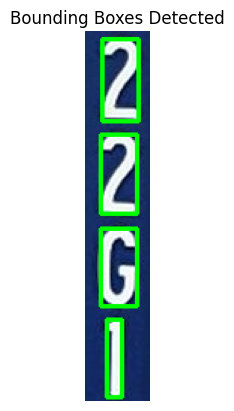

The image is vertical, resizing to horizontal orientation.


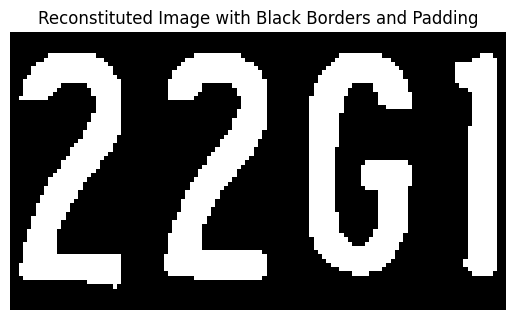

Reconstituted image saved as 'labeled_samples\124126001\1-124126001-OCR-RF-D01\1-124126001-OCR-RF-D01_reconst_1_class1.jpg'
Saved: labeled_samples\124126001\1-124126001-OCR-RF-D01\1-124126001-OCR-RF-D01_reconst_1_class1.jpg
Mean value of the binary image: 66.75815529867458


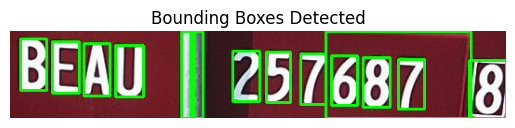

The image is horizontal


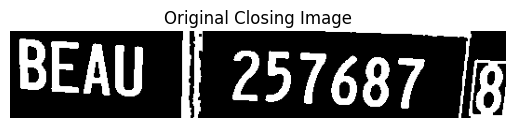

Original closing image saved as 'labeled_samples\124835001\1-124835001-OCR-AH-A01\1-124835001-OCR-AH-A01_reconst_0_class0.jpg'
Saved: labeled_samples\124835001\1-124835001-OCR-AH-A01\1-124835001-OCR-AH-A01_reconst_0_class0.jpg
Mean value of the binary image: 88.53221502096835


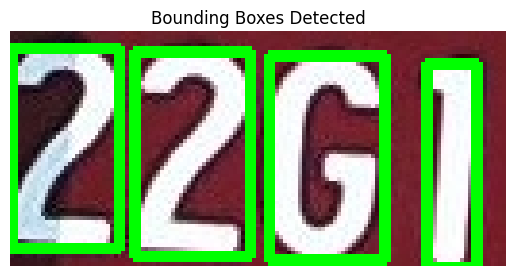

The image is horizontal


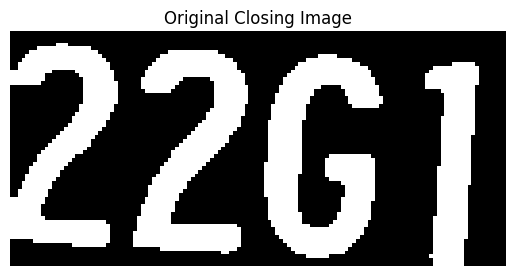

Original closing image saved as 'labeled_samples\124835001\1-124835001-OCR-AH-A01\1-124835001-OCR-AH-A01_reconst_1_class1.jpg'
Saved: labeled_samples\124835001\1-124835001-OCR-AH-A01\1-124835001-OCR-AH-A01_reconst_1_class1.jpg
Mean value of the binary image: 67.34257057181263


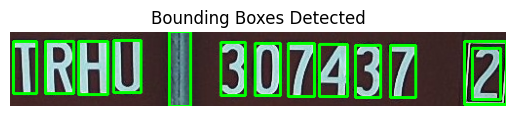

The image is horizontal


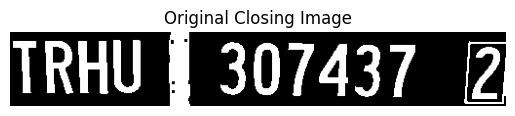

Original closing image saved as 'labeled_samples\124835001\1-124835001-OCR-AS-B01\1-124835001-OCR-AS-B01_reconst_0_class0.jpg'
Saved: labeled_samples\124835001\1-124835001-OCR-AS-B01\1-124835001-OCR-AS-B01_reconst_0_class0.jpg
Mean value of the binary image: 69.71223021582733


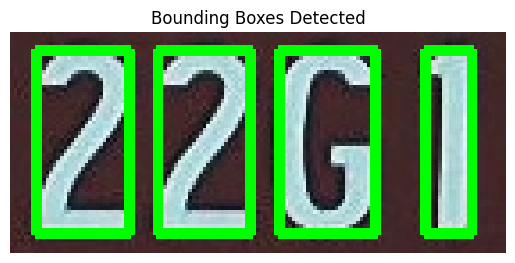

The image is horizontal


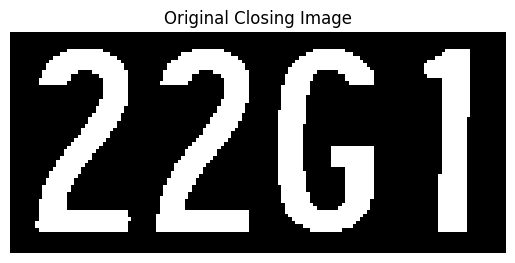

Original closing image saved as 'labeled_samples\124835001\1-124835001-OCR-AS-B01\1-124835001-OCR-AS-B01_reconst_1_class1.jpg'
Saved: labeled_samples\124835001\1-124835001-OCR-AS-B01\1-124835001-OCR-AS-B01_reconst_1_class1.jpg
Mean value of the binary image: 57.2364927651666


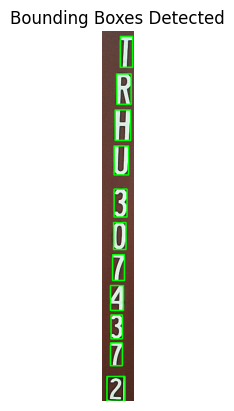

The image is vertical, resizing to horizontal orientation.


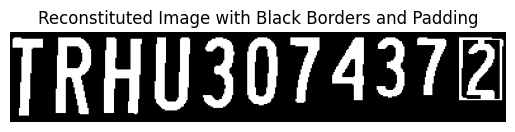

Reconstituted image saved as 'labeled_samples\124835001\1-124835001-OCR-LB-C02\1-124835001-OCR-LB-C02_reconst_0_class0.jpg'
Saved: labeled_samples\124835001\1-124835001-OCR-LB-C02\1-124835001-OCR-LB-C02_reconst_0_class0.jpg
Mean value of the binary image: 67.23930481283422


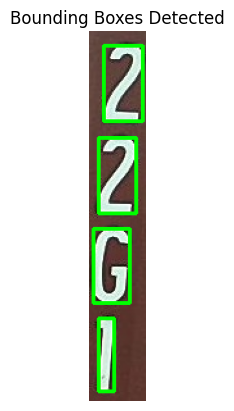

The image is vertical, resizing to horizontal orientation.


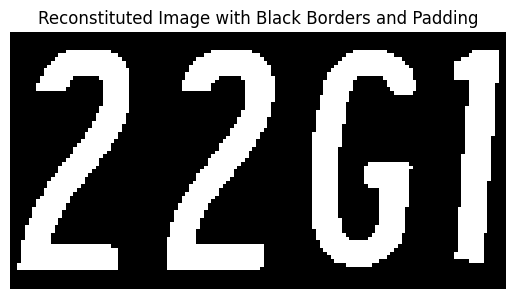

Reconstituted image saved as 'labeled_samples\124835001\1-124835001-OCR-LB-C02\1-124835001-OCR-LB-C02_reconst_1_class1.jpg'
Saved: labeled_samples\124835001\1-124835001-OCR-LB-C02\1-124835001-OCR-LB-C02_reconst_1_class1.jpg
Mean value of the binary image: 60.283378901799956


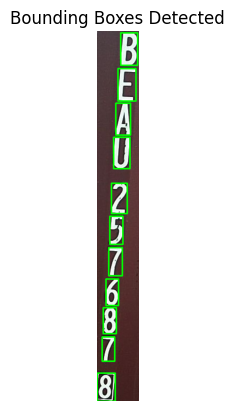

The image is vertical, resizing to horizontal orientation.


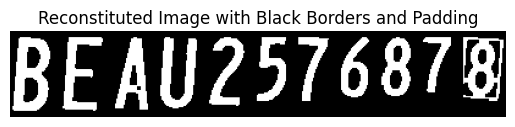

Reconstituted image saved as 'labeled_samples\124835001\1-124835001-OCR-LF-C01\1-124835001-OCR-LF-C01_reconst_0_class0.jpg'
Saved: labeled_samples\124835001\1-124835001-OCR-LF-C01\1-124835001-OCR-LF-C01_reconst_0_class0.jpg
Mean value of the binary image: 82.10843373493977


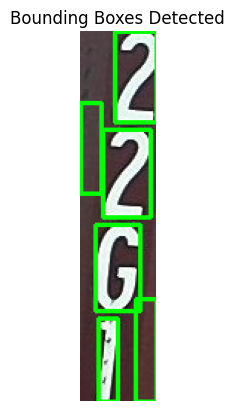

The image is vertical, resizing to horizontal orientation.


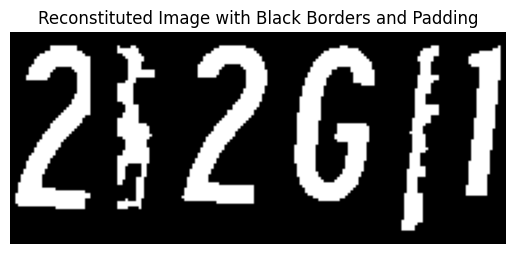

Reconstituted image saved as 'labeled_samples\124835001\1-124835001-OCR-LF-C01\1-124835001-OCR-LF-C01_reconst_1_class1.jpg'
Saved: labeled_samples\124835001\1-124835001-OCR-LF-C01\1-124835001-OCR-LF-C01_reconst_1_class1.jpg
Mean value of the binary image: 58.36810294404367


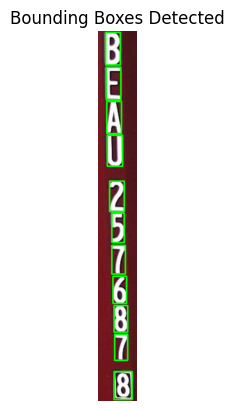

The image is vertical, resizing to horizontal orientation.


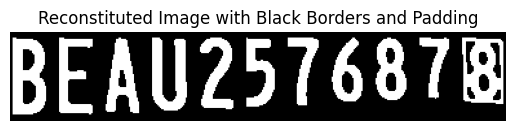

Reconstituted image saved as 'labeled_samples\124835001\1-124835001-OCR-RF-D01\1-124835001-OCR-RF-D01_reconst_0_class0.jpg'
Saved: labeled_samples\124835001\1-124835001-OCR-RF-D01\1-124835001-OCR-RF-D01_reconst_0_class0.jpg
Mean value of the binary image: 69.62773251593127


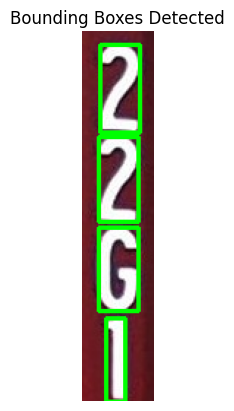

The image is vertical, resizing to horizontal orientation.


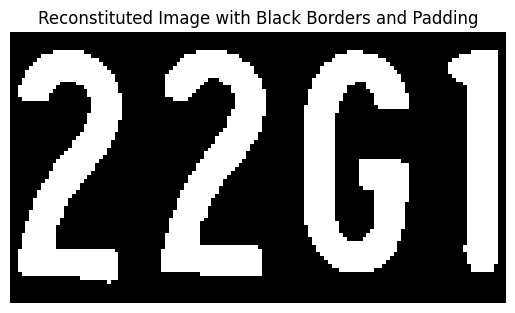

Reconstituted image saved as 'labeled_samples\124835001\1-124835001-OCR-RF-D01\1-124835001-OCR-RF-D01_reconst_1_class1.jpg'
Saved: labeled_samples\124835001\1-124835001-OCR-RF-D01\1-124835001-OCR-RF-D01_reconst_1_class1.jpg
Mean value of the binary image: 60.385416666666664


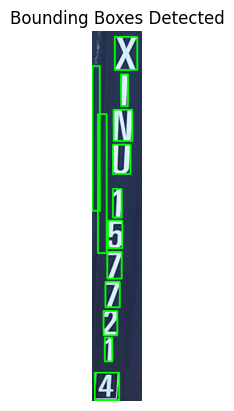

The image is vertical, resizing to horizontal orientation.


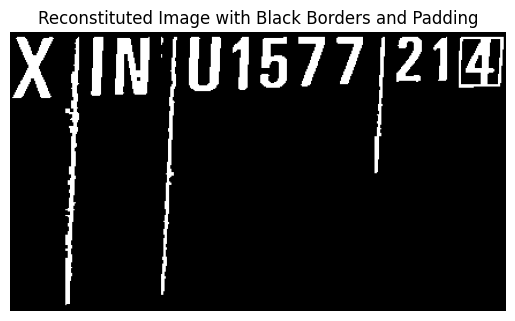

Reconstituted image saved as 'labeled_samples\125722001\1-125722001-OCR-AH-A01\1-125722001-OCR-AH-A01_reconst_0_class0.jpg'
Saved: labeled_samples\125722001\1-125722001-OCR-AH-A01\1-125722001-OCR-AH-A01_reconst_0_class0.jpg
Mean value of the binary image: 71.93915857605178


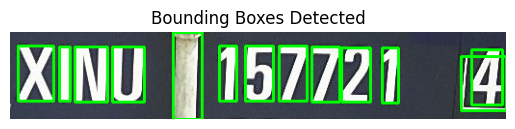

The image is horizontal


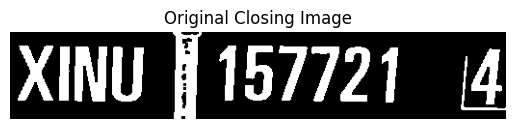

Original closing image saved as 'labeled_samples\125722001\1-125722001-OCR-AS-B01\1-125722001-OCR-AS-B01_reconst_0_class0.jpg'
Saved: labeled_samples\125722001\1-125722001-OCR-AS-B01\1-125722001-OCR-AS-B01_reconst_0_class0.jpg
Mean value of the binary image: 88.26506791171477


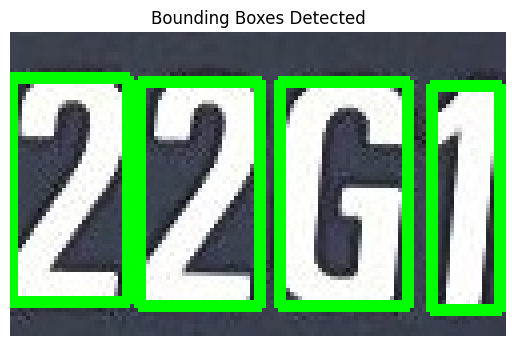

The image is horizontal


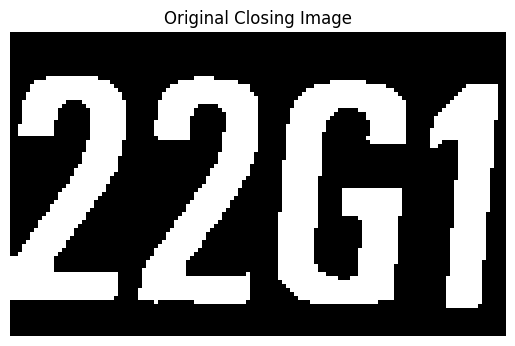

Original closing image saved as 'labeled_samples\125722001\1-125722001-OCR-AS-B01\1-125722001-OCR-AS-B01_reconst_1_class1.jpg'
Saved: labeled_samples\125722001\1-125722001-OCR-AS-B01\1-125722001-OCR-AS-B01_reconst_1_class1.jpg
Mean value of the binary image: 88.2592142515481


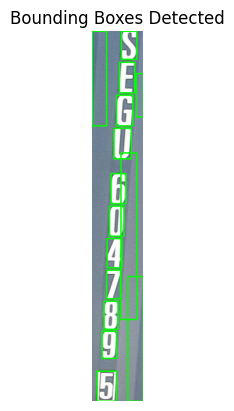

The image is vertical, resizing to horizontal orientation.


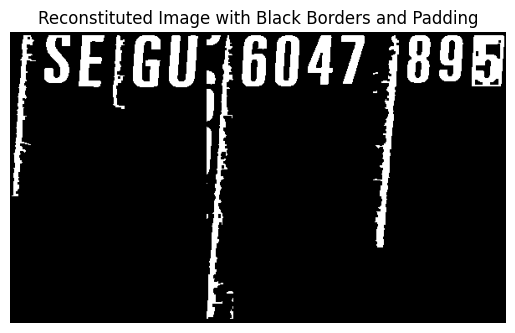

Reconstituted image saved as 'labeled_samples\125722001\1-125722001-OCR-LB-C02\1-125722001-OCR-LB-C02_reconst_0_class0.jpg'
Saved: labeled_samples\125722001\1-125722001-OCR-LB-C02\1-125722001-OCR-LB-C02_reconst_0_class0.jpg
Mean value of the binary image: 93.60687022900764


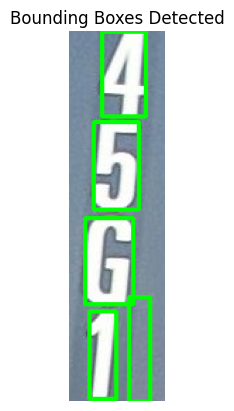

The image is vertical, resizing to horizontal orientation.


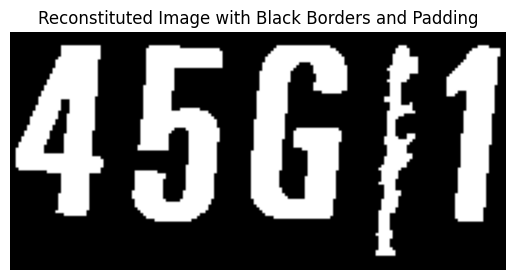

Reconstituted image saved as 'labeled_samples\125722001\1-125722001-OCR-LB-C02\1-125722001-OCR-LB-C02_reconst_1_class1.jpg'
Saved: labeled_samples\125722001\1-125722001-OCR-LB-C02\1-125722001-OCR-LB-C02_reconst_1_class1.jpg
Mean value of the binary image: 68.2113938692886


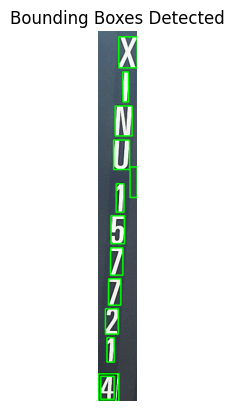

The image is vertical, resizing to horizontal orientation.


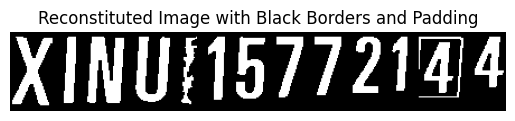

Reconstituted image saved as 'labeled_samples\125722001\1-125722001-OCR-LF-C01\1-125722001-OCR-LF-C01_reconst_0_class0.jpg'
Saved: labeled_samples\125722001\1-125722001-OCR-LF-C01\1-125722001-OCR-LF-C01_reconst_0_class0.jpg
Mean value of the binary image: 74.03105861767278


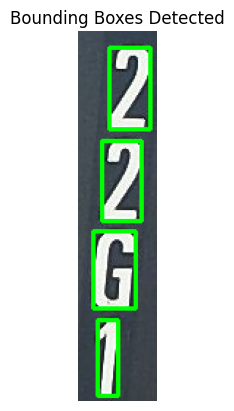

The image is vertical, resizing to horizontal orientation.


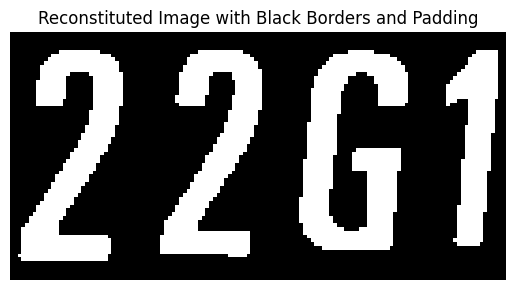

Reconstituted image saved as 'labeled_samples\125722001\1-125722001-OCR-LF-C01\1-125722001-OCR-LF-C01_reconst_1_class1.jpg'
Saved: labeled_samples\125722001\1-125722001-OCR-LF-C01\1-125722001-OCR-LF-C01_reconst_1_class1.jpg
Mean value of the binary image: 48.90909090909091


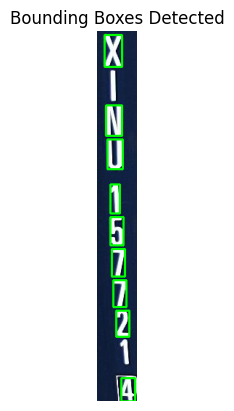

The image is vertical, resizing to horizontal orientation.


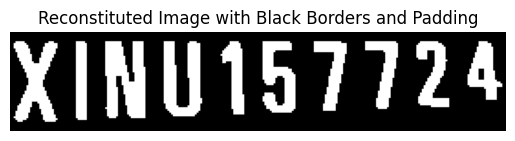

Reconstituted image saved as 'labeled_samples\125722001\1-125722001-OCR-RF-D01\1-125722001-OCR-RF-D01_reconst_0_class0.jpg'
Saved: labeled_samples\125722001\1-125722001-OCR-RF-D01\1-125722001-OCR-RF-D01_reconst_0_class0.jpg
Mean value of the binary image: 61.12414187643021


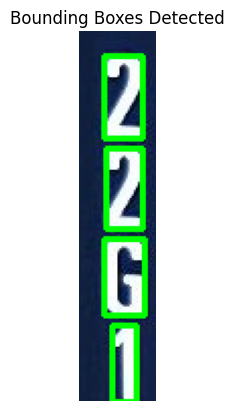

The image is vertical, resizing to horizontal orientation.


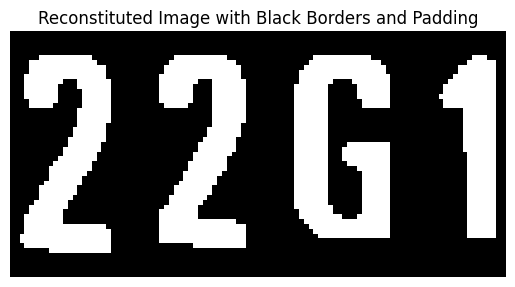

Reconstituted image saved as 'labeled_samples\125722001\1-125722001-OCR-RF-D01\1-125722001-OCR-RF-D01_reconst_1_class1.jpg'
Saved: labeled_samples\125722001\1-125722001-OCR-RF-D01\1-125722001-OCR-RF-D01_reconst_1_class1.jpg
Mean value of the binary image: 83.66774020397209


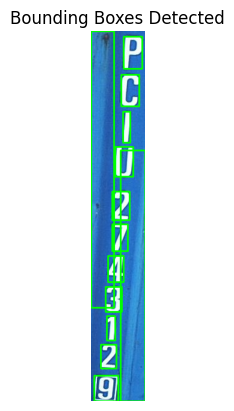

The image is vertical, resizing to horizontal orientation.


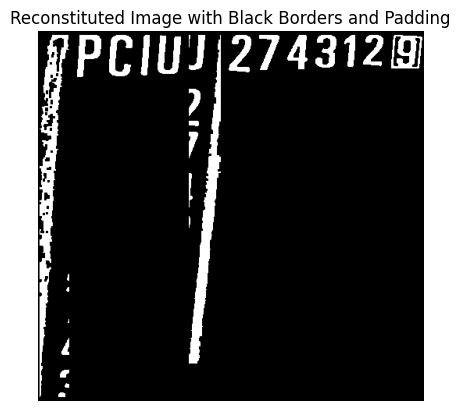

Reconstituted image saved as 'labeled_samples\130713001\1-130713001-OCR-AH-A01\1-130713001-OCR-AH-A01_reconst_0_class0.jpg'
Saved: labeled_samples\130713001\1-130713001-OCR-AH-A01\1-130713001-OCR-AH-A01_reconst_0_class0.jpg
Mean value of the binary image: 76.48507025761124


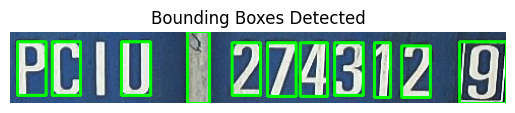

The image is horizontal


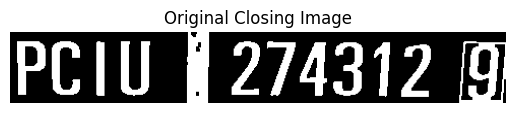

Original closing image saved as 'labeled_samples\130713001\1-130713001-OCR-AS-B01\1-130713001-OCR-AS-B01_reconst_0_class0.jpg'
Saved: labeled_samples\130713001\1-130713001-OCR-AS-B01\1-130713001-OCR-AS-B01_reconst_0_class0.jpg
Mean value of the binary image: 77.2238788167939


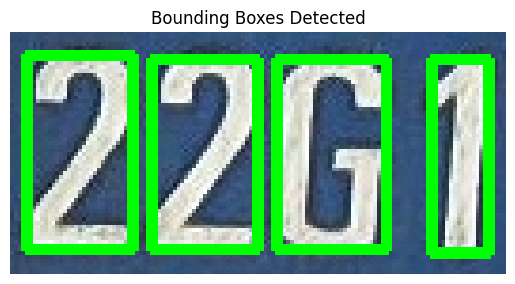

The image is horizontal


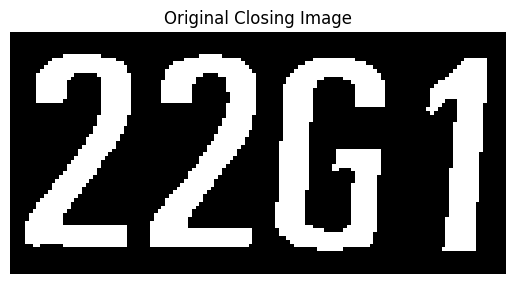

Original closing image saved as 'labeled_samples\130713001\1-130713001-OCR-AS-B01\1-130713001-OCR-AS-B01_reconst_1_class1.jpg'
Saved: labeled_samples\130713001\1-130713001-OCR-AS-B01\1-130713001-OCR-AS-B01_reconst_1_class1.jpg
Mean value of the binary image: 94.89965796454


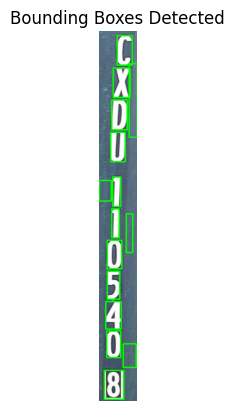

The image is vertical, resizing to horizontal orientation.


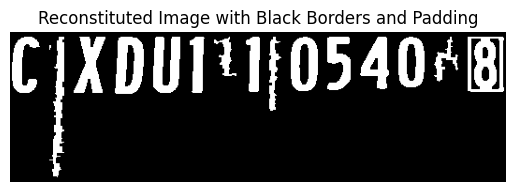

Reconstituted image saved as 'labeled_samples\130713001\1-130713001-OCR-LB-C02\1-130713001-OCR-LB-C02_reconst_0_class0.jpg'
Saved: labeled_samples\130713001\1-130713001-OCR-LB-C02\1-130713001-OCR-LB-C02_reconst_0_class0.jpg
Mean value of the binary image: 98.26136715125271


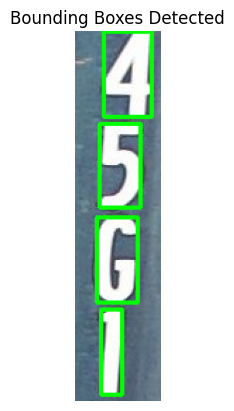

The image is vertical, resizing to horizontal orientation.


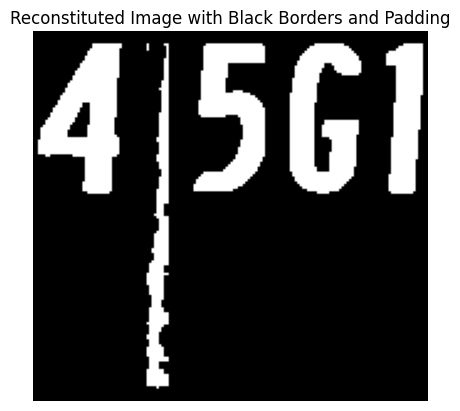

Reconstituted image saved as 'labeled_samples\130713001\1-130713001-OCR-LB-C02\1-130713001-OCR-LB-C02_reconst_1_class1.jpg'
Saved: labeled_samples\130713001\1-130713001-OCR-LB-C02\1-130713001-OCR-LB-C02_reconst_1_class1.jpg
Mean value of the binary image: 78.96153846153847


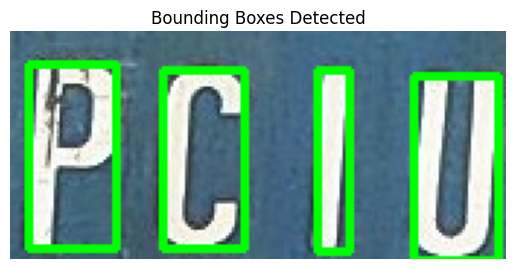

The image is horizontal


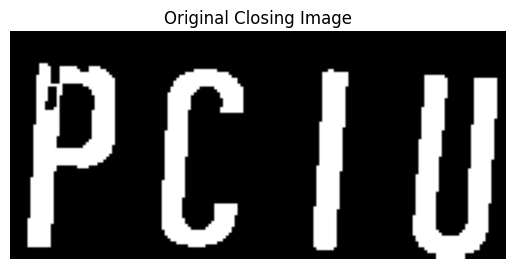

Original closing image saved as 'labeled_samples\130713001\1-130713001-OCR-LF-C01\1-130713001-OCR-LF-C01_reconst_0_class1.jpg'
Saved: labeled_samples\130713001\1-130713001-OCR-LF-C01\1-130713001-OCR-LF-C01_reconst_0_class1.jpg
Mean value of the binary image: 76.07024580512217


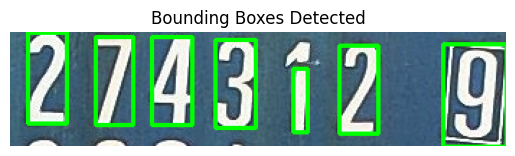

The image is horizontal


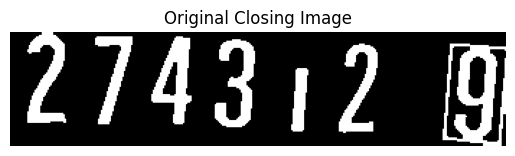

Original closing image saved as 'labeled_samples\130713001\1-130713001-OCR-LF-C01\1-130713001-OCR-LF-C01_reconst_1_class-1.jpg'
Saved: labeled_samples\130713001\1-130713001-OCR-LF-C01\1-130713001-OCR-LF-C01_reconst_1_class-1.jpg
Mean value of the binary image: 73.97387496224705


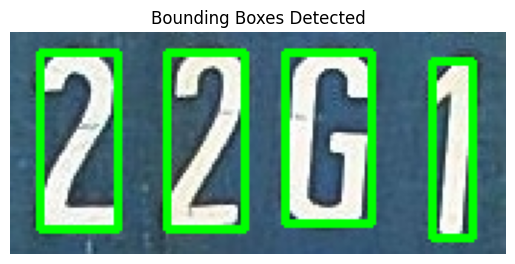

The image is horizontal


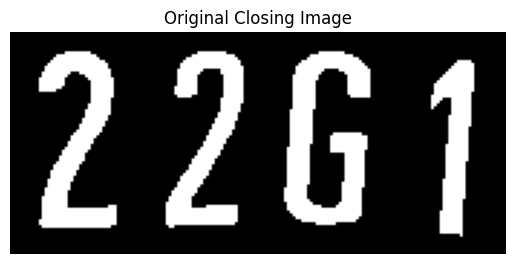

Original closing image saved as 'labeled_samples\130713001\1-130713001-OCR-LF-C01\1-130713001-OCR-LF-C01_reconst_2_class1.jpg'
Saved: labeled_samples\130713001\1-130713001-OCR-LF-C01\1-130713001-OCR-LF-C01_reconst_2_class1.jpg
Mean value of the binary image: 67.98701298701299


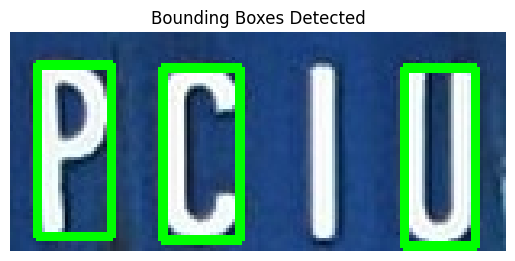

The image is horizontal


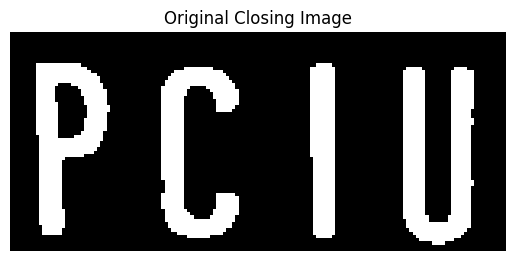

Original closing image saved as 'labeled_samples\130713001\1-130713001-OCR-RF-D01\1-130713001-OCR-RF-D01_reconst_0_class1.jpg'
Saved: labeled_samples\130713001\1-130713001-OCR-RF-D01\1-130713001-OCR-RF-D01_reconst_0_class1.jpg
Mean value of the binary image: 70.21593594119192


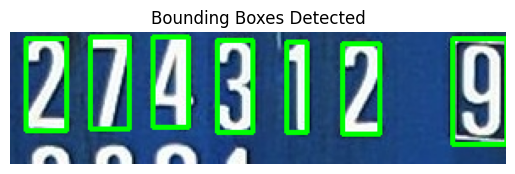

The image is horizontal


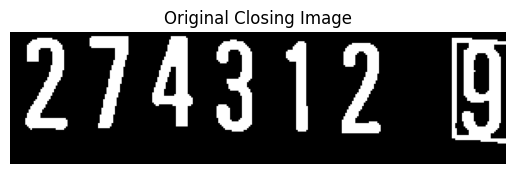

Original closing image saved as 'labeled_samples\130713001\1-130713001-OCR-RF-D01\1-130713001-OCR-RF-D01_reconst_1_class-1.jpg'
Saved: labeled_samples\130713001\1-130713001-OCR-RF-D01\1-130713001-OCR-RF-D01_reconst_1_class-1.jpg
Mean value of the binary image: 71.57942430703625


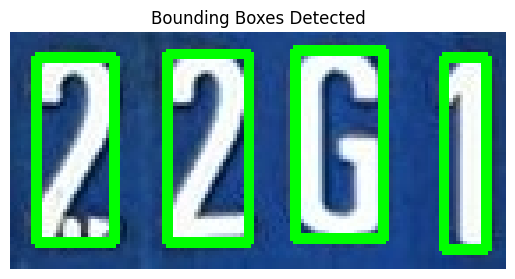

The image is horizontal


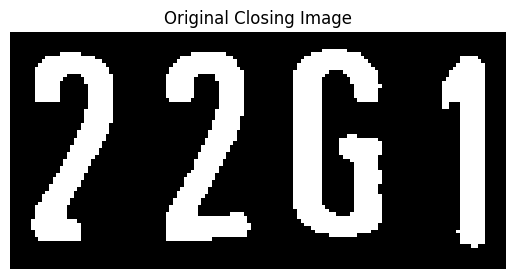

Original closing image saved as 'labeled_samples\130713001\1-130713001-OCR-RF-D01\1-130713001-OCR-RF-D01_reconst_2_class1.jpg'
Saved: labeled_samples\130713001\1-130713001-OCR-RF-D01\1-130713001-OCR-RF-D01_reconst_2_class1.jpg
Mean value of the binary image: 118.28527706185567


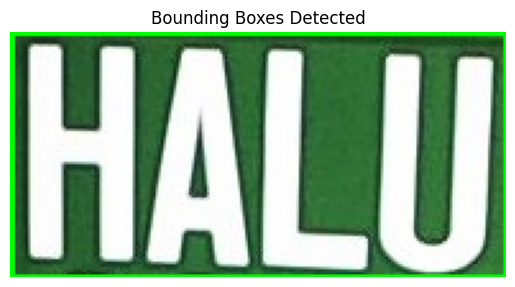

The image is horizontal


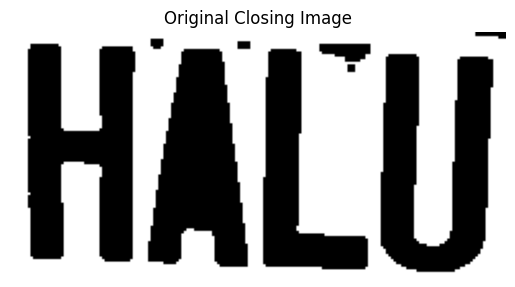

Original closing image saved as 'labeled_samples\142900001\1-142900001-OCR-AH-A01\1-142900001-OCR-AH-A01_reconst_0_class1.jpg'
Saved: labeled_samples\142900001\1-142900001-OCR-AH-A01\1-142900001-OCR-AH-A01_reconst_0_class1.jpg
Mean value of the binary image: 123.1956289978678


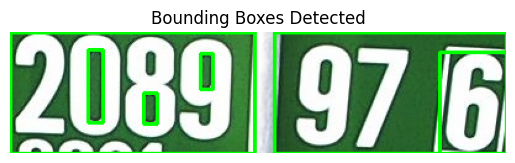

The image is horizontal


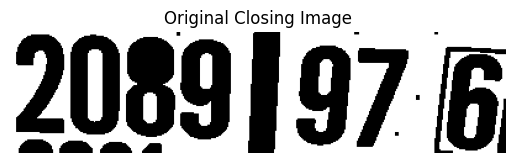

Original closing image saved as 'labeled_samples\142900001\1-142900001-OCR-AH-A01\1-142900001-OCR-AH-A01_reconst_1_class-1.jpg'
Saved: labeled_samples\142900001\1-142900001-OCR-AH-A01\1-142900001-OCR-AH-A01_reconst_1_class-1.jpg
Mean value of the binary image: 111.02186711522288


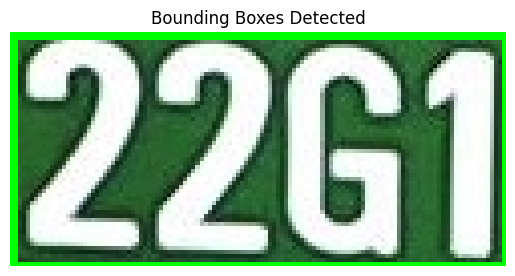

The image is horizontal


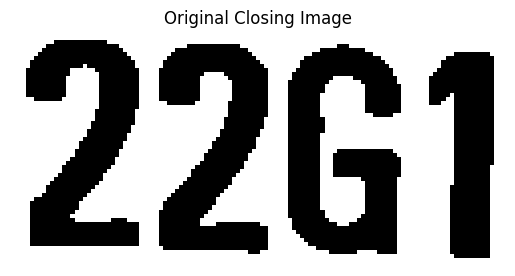

Original closing image saved as 'labeled_samples\142900001\1-142900001-OCR-AH-A01\1-142900001-OCR-AH-A01_reconst_2_class1.jpg'
Saved: labeled_samples\142900001\1-142900001-OCR-AH-A01\1-142900001-OCR-AH-A01_reconst_2_class1.jpg
Mean value of the binary image: 76.76118082368082


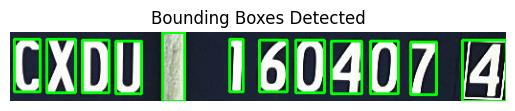

The image is horizontal


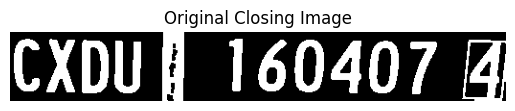

Original closing image saved as 'labeled_samples\142900001\1-142900001-OCR-AS-B01\1-142900001-OCR-AS-B01_reconst_0_class0.jpg'
Saved: labeled_samples\142900001\1-142900001-OCR-AS-B01\1-142900001-OCR-AS-B01_reconst_0_class0.jpg
Mean value of the binary image: 72.72173464119773


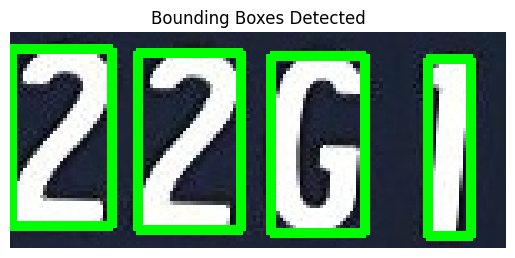

The image is horizontal


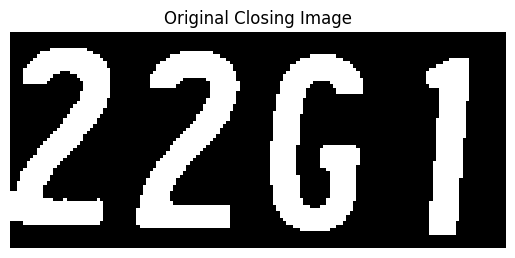

Original closing image saved as 'labeled_samples\142900001\1-142900001-OCR-AS-B01\1-142900001-OCR-AS-B01_reconst_1_class1.jpg'
Saved: labeled_samples\142900001\1-142900001-OCR-AS-B01\1-142900001-OCR-AS-B01_reconst_1_class1.jpg
Mean value of the binary image: 53.576091289615306


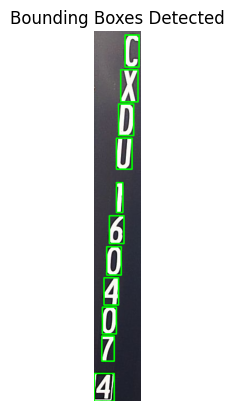

The image is vertical, resizing to horizontal orientation.


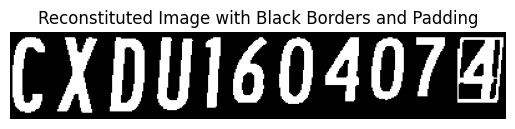

Reconstituted image saved as 'labeled_samples\142900001\1-142900001-OCR-LB-C02\1-142900001-OCR-LB-C02_reconst_0_class0.jpg'
Saved: labeled_samples\142900001\1-142900001-OCR-LB-C02\1-142900001-OCR-LB-C02_reconst_0_class0.jpg
Mean value of the binary image: 62.847081712062256


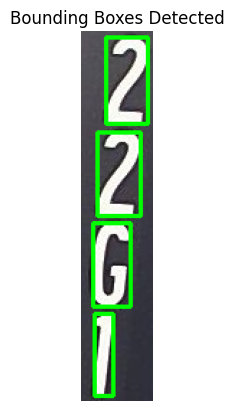

The image is vertical, resizing to horizontal orientation.


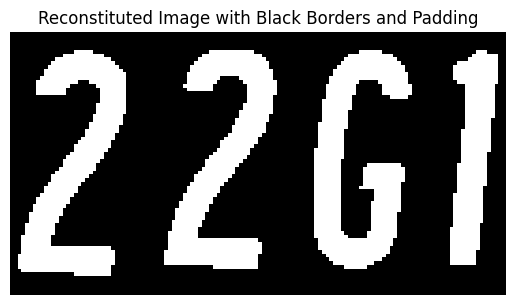

Reconstituted image saved as 'labeled_samples\142900001\1-142900001-OCR-LB-C02\1-142900001-OCR-LB-C02_reconst_1_class1.jpg'
Saved: labeled_samples\142900001\1-142900001-OCR-LB-C02\1-142900001-OCR-LB-C02_reconst_1_class1.jpg
Mean value of the binary image: 86.47625160462131


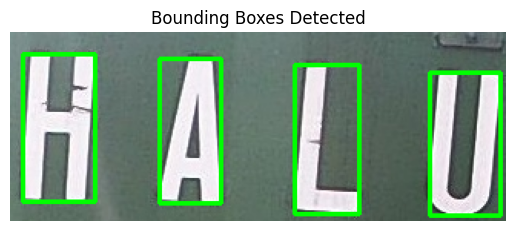

The image is horizontal


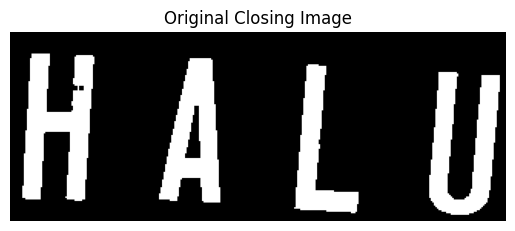

Original closing image saved as 'labeled_samples\142900001\1-142900001-OCR-LF-C01\1-142900001-OCR-LF-C01_reconst_0_class1.jpg'
Saved: labeled_samples\142900001\1-142900001-OCR-LF-C01\1-142900001-OCR-LF-C01_reconst_0_class1.jpg
Mean value of the binary image: 78.9252151938719


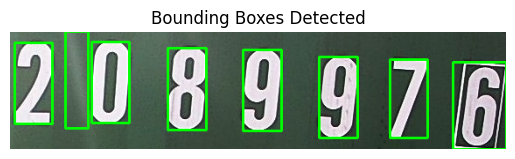

The image is horizontal


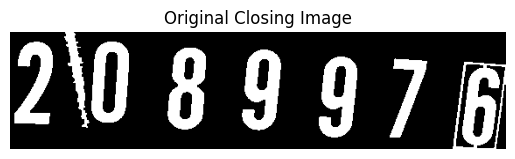

Original closing image saved as 'labeled_samples\142900001\1-142900001-OCR-LF-C01\1-142900001-OCR-LF-C01_reconst_1_class-1.jpg'
Saved: labeled_samples\142900001\1-142900001-OCR-LF-C01\1-142900001-OCR-LF-C01_reconst_1_class-1.jpg
Mean value of the binary image: 69.24039564220183


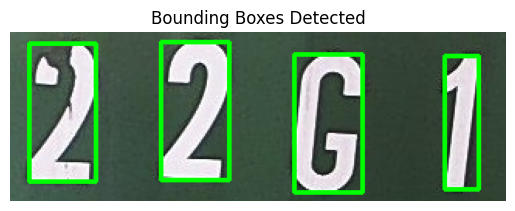

The image is horizontal


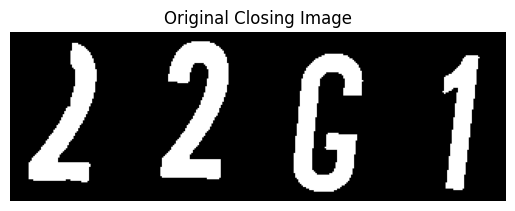

Original closing image saved as 'labeled_samples\142900001\1-142900001-OCR-LF-C01\1-142900001-OCR-LF-C01_reconst_2_class1.jpg'
Saved: labeled_samples\142900001\1-142900001-OCR-LF-C01\1-142900001-OCR-LF-C01_reconst_2_class1.jpg
Mean value of the binary image: 82.5500943807173


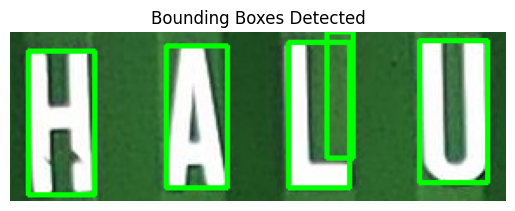

The image is horizontal


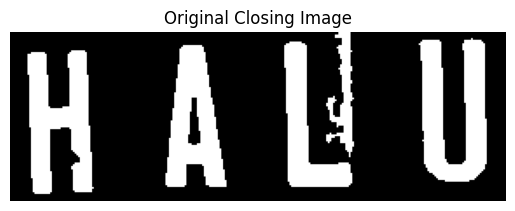

Original closing image saved as 'labeled_samples\142900001\1-142900001-OCR-RF-D01\1-142900001-OCR-RF-D01_reconst_0_class1.jpg'
Saved: labeled_samples\142900001\1-142900001-OCR-RF-D01\1-142900001-OCR-RF-D01_reconst_0_class1.jpg
Mean value of the binary image: 89.53373015873017


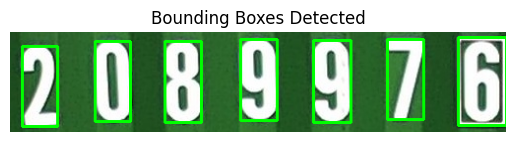

The image is horizontal


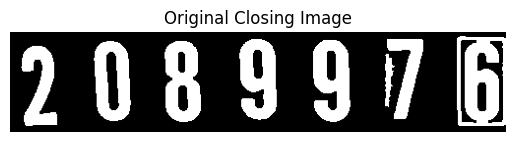

Original closing image saved as 'labeled_samples\142900001\1-142900001-OCR-RF-D01\1-142900001-OCR-RF-D01_reconst_1_class-1.jpg'
Saved: labeled_samples\142900001\1-142900001-OCR-RF-D01\1-142900001-OCR-RF-D01_reconst_1_class-1.jpg
Mean value of the binary image: 79.420333655706


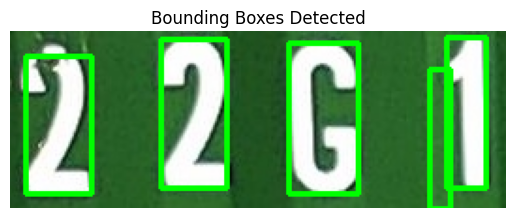

The image is horizontal


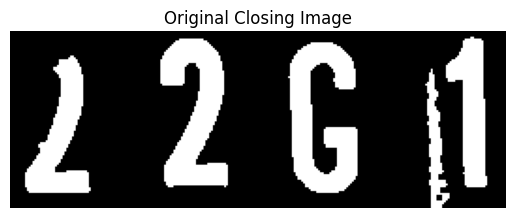

Original closing image saved as 'labeled_samples\142900001\1-142900001-OCR-RF-D01\1-142900001-OCR-RF-D01_reconst_2_class1.jpg'
Saved: labeled_samples\142900001\1-142900001-OCR-RF-D01\1-142900001-OCR-RF-D01_reconst_2_class1.jpg
Mean value of the binary image: 125.25469965427831


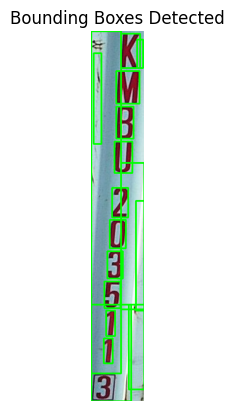

The image is vertical, resizing to horizontal orientation.


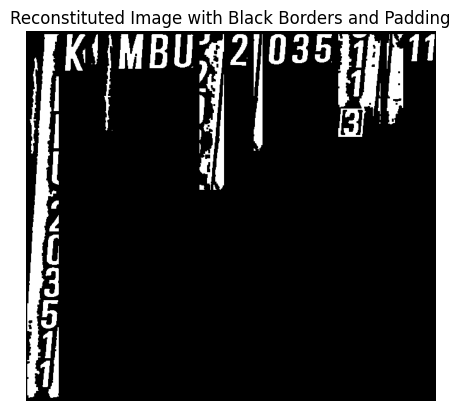

Reconstituted image saved as 'labeled_samples\144241001\1-144241001-OCR-AH-A01\1-144241001-OCR-AH-A01_reconst_0_class0.jpg'
Saved: labeled_samples\144241001\1-144241001-OCR-AH-A01\1-144241001-OCR-AH-A01_reconst_0_class0.jpg
Mean value of the binary image: 82.10272373540856


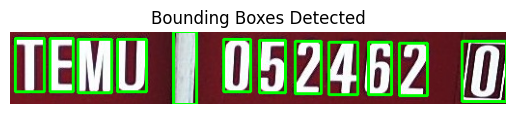

The image is horizontal


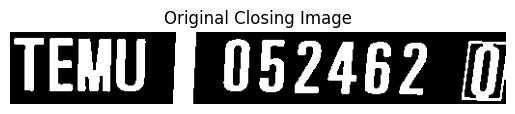

Original closing image saved as 'labeled_samples\144241001\1-144241001-OCR-AS-B01\1-144241001-OCR-AS-B01_reconst_0_class0.jpg'
Saved: labeled_samples\144241001\1-144241001-OCR-AS-B01\1-144241001-OCR-AS-B01_reconst_0_class0.jpg
Mean value of the binary image: 72.91437549096622


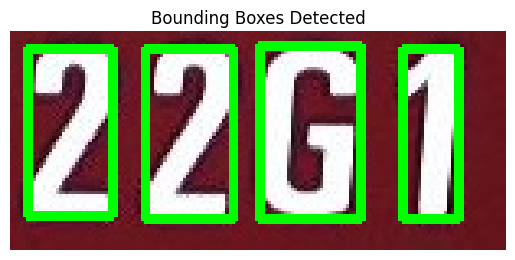

The image is horizontal


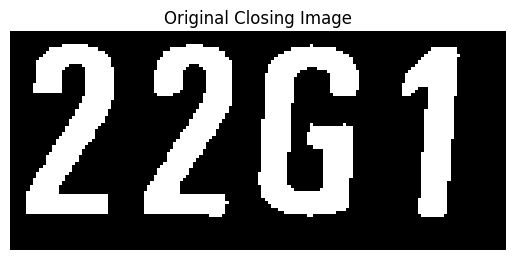

Original closing image saved as 'labeled_samples\144241001\1-144241001-OCR-AS-B01\1-144241001-OCR-AS-B01_reconst_1_class1.jpg'
Saved: labeled_samples\144241001\1-144241001-OCR-AS-B01\1-144241001-OCR-AS-B01_reconst_1_class1.jpg
Mean value of the binary image: 63.95720476706392


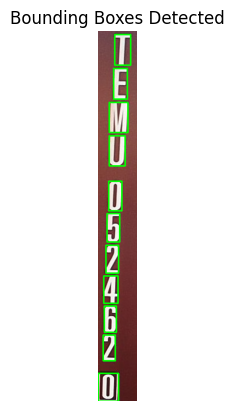

The image is vertical, resizing to horizontal orientation.


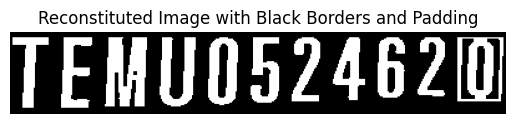

Reconstituted image saved as 'labeled_samples\144241001\1-144241001-OCR-LB-C02\1-144241001-OCR-LB-C02_reconst_0_class0.jpg'
Saved: labeled_samples\144241001\1-144241001-OCR-LB-C02\1-144241001-OCR-LB-C02_reconst_0_class0.jpg
Mean value of the binary image: 71.2237532808399


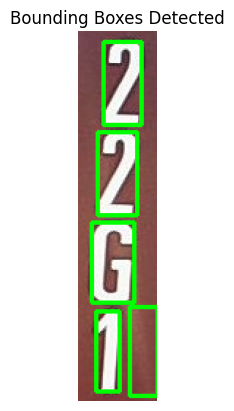

The image is vertical, resizing to horizontal orientation.


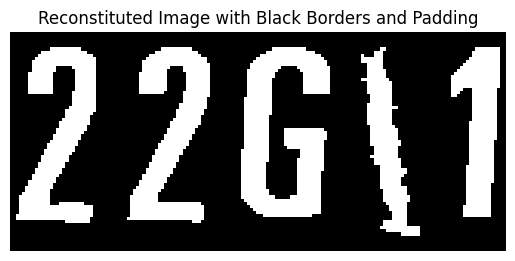

Reconstituted image saved as 'labeled_samples\144241001\1-144241001-OCR-LB-C02\1-144241001-OCR-LB-C02_reconst_1_class1.jpg'
Saved: labeled_samples\144241001\1-144241001-OCR-LB-C02\1-144241001-OCR-LB-C02_reconst_1_class1.jpg
Mean value of the binary image: 125.62238805970149


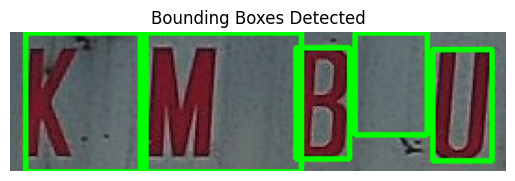

The image is horizontal


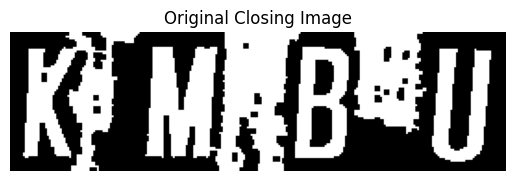

Original closing image saved as 'labeled_samples\144241001\1-144241001-OCR-LF-C01\1-144241001-OCR-LF-C01_reconst_0_class1.jpg'
Saved: labeled_samples\144241001\1-144241001-OCR-LF-C01\1-144241001-OCR-LF-C01_reconst_0_class1.jpg
Mean value of the binary image: 123.3450261079127


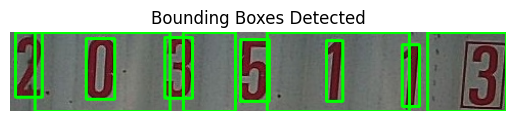

The image is horizontal


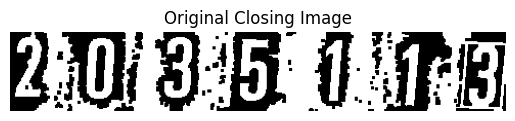

Original closing image saved as 'labeled_samples\144241001\1-144241001-OCR-LF-C01\1-144241001-OCR-LF-C01_reconst_1_class-1.jpg'
Saved: labeled_samples\144241001\1-144241001-OCR-LF-C01\1-144241001-OCR-LF-C01_reconst_1_class-1.jpg
Mean value of the binary image: 125.57138416908413


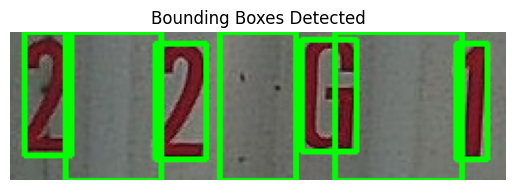

The image is horizontal


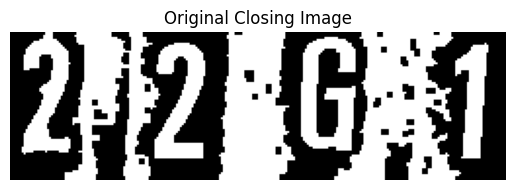

Original closing image saved as 'labeled_samples\144241001\1-144241001-OCR-LF-C01\1-144241001-OCR-LF-C01_reconst_2_class1.jpg'
Saved: labeled_samples\144241001\1-144241001-OCR-LF-C01\1-144241001-OCR-LF-C01_reconst_2_class1.jpg
Mean value of the binary image: 133.6881005173688


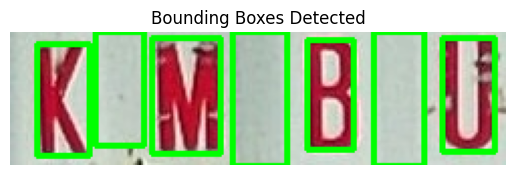

The image is horizontal


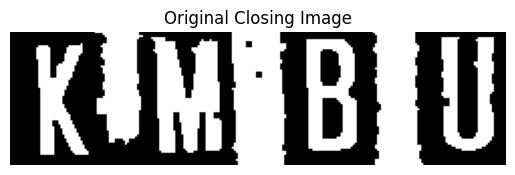

Original closing image saved as 'labeled_samples\144241001\1-144241001-OCR-RF-D01\1-144241001-OCR-RF-D01_reconst_0_class1.jpg'
Saved: labeled_samples\144241001\1-144241001-OCR-RF-D01\1-144241001-OCR-RF-D01_reconst_0_class1.jpg
Mean value of the binary image: 135.37520475020474


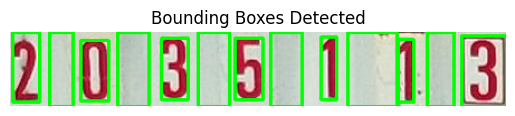

The image is horizontal


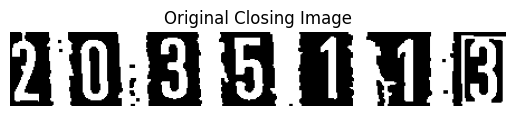

Original closing image saved as 'labeled_samples\144241001\1-144241001-OCR-RF-D01\1-144241001-OCR-RF-D01_reconst_1_class-1.jpg'
Saved: labeled_samples\144241001\1-144241001-OCR-RF-D01\1-144241001-OCR-RF-D01_reconst_1_class-1.jpg
Mean value of the binary image: 143.33697620683196


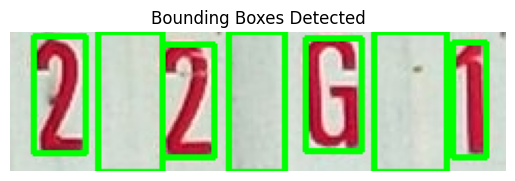

The image is horizontal


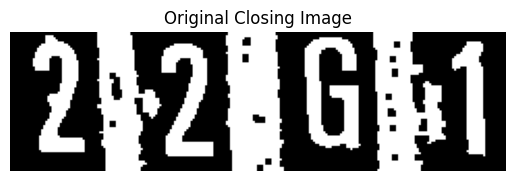

Original closing image saved as 'labeled_samples\144241001\1-144241001-OCR-RF-D01\1-144241001-OCR-RF-D01_reconst_2_class1.jpg'
Saved: labeled_samples\144241001\1-144241001-OCR-RF-D01\1-144241001-OCR-RF-D01_reconst_2_class1.jpg
Mean value of the binary image: 137.68278965129358


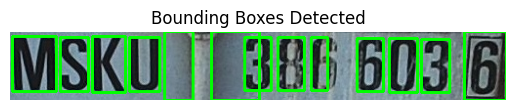

The image is horizontal


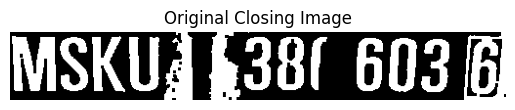

Original closing image saved as 'labeled_samples\145327001\1-145327001-OCR-AH-A01\1-145327001-OCR-AH-A01_reconst_0_class0.jpg'
Saved: labeled_samples\145327001\1-145327001-OCR-AH-A01\1-145327001-OCR-AH-A01_reconst_0_class0.jpg
Mean value of the binary image: 160.8984375


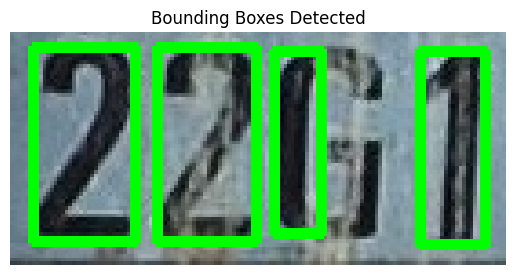

The image is horizontal


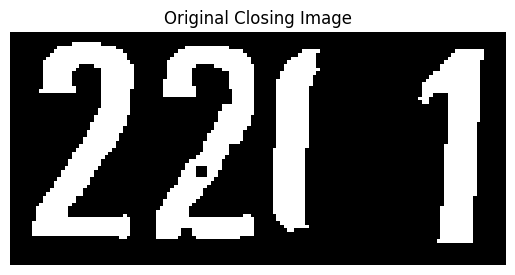

Original closing image saved as 'labeled_samples\145327001\1-145327001-OCR-AH-A01\1-145327001-OCR-AH-A01_reconst_1_class1.jpg'
Saved: labeled_samples\145327001\1-145327001-OCR-AH-A01\1-145327001-OCR-AH-A01_reconst_1_class1.jpg
Mean value of the binary image: 126.68251527097864


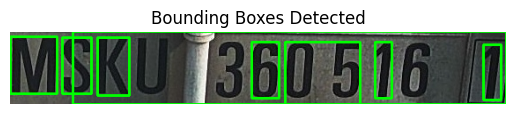

The image is horizontal


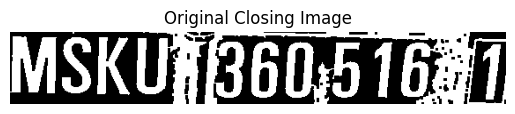

Original closing image saved as 'labeled_samples\145327001\1-145327001-OCR-AS-B01\1-145327001-OCR-AS-B01_reconst_0_class0.jpg'
Saved: labeled_samples\145327001\1-145327001-OCR-AS-B01\1-145327001-OCR-AS-B01_reconst_0_class0.jpg
Mean value of the binary image: 132.1861471861472


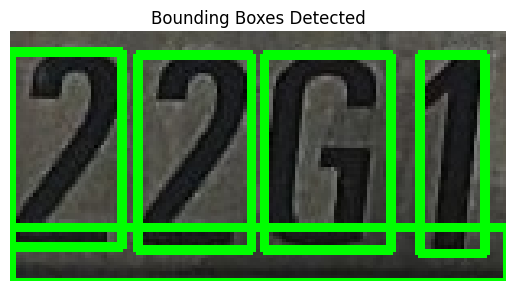

The image is horizontal


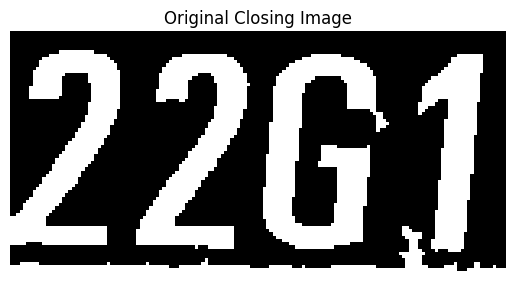

Original closing image saved as 'labeled_samples\145327001\1-145327001-OCR-AS-B01\1-145327001-OCR-AS-B01_reconst_1_class1.jpg'
Saved: labeled_samples\145327001\1-145327001-OCR-AS-B01\1-145327001-OCR-AS-B01_reconst_1_class1.jpg
Mean value of the binary image: 141.1897179253867


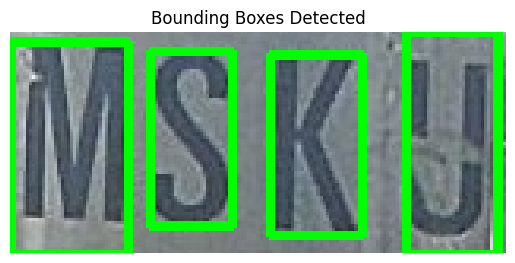

The image is horizontal


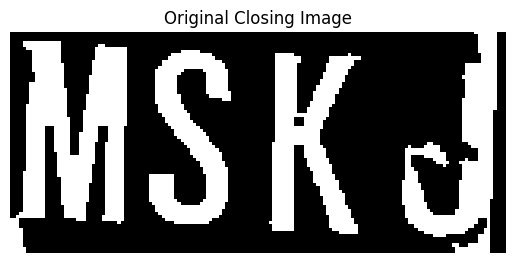

Original closing image saved as 'labeled_samples\145327001\1-145327001-OCR-LB-C02\1-145327001-OCR-LB-C02_reconst_0_class1.jpg'
Saved: labeled_samples\145327001\1-145327001-OCR-LB-C02\1-145327001-OCR-LB-C02_reconst_0_class1.jpg
Mean value of the binary image: 137.47298503023694


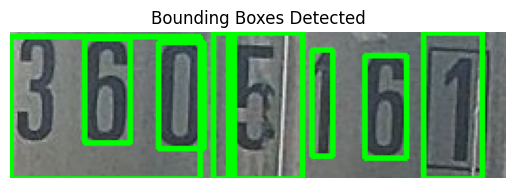

The image is horizontal


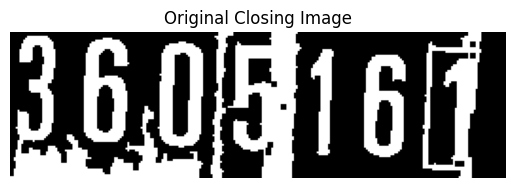

Original closing image saved as 'labeled_samples\145327001\1-145327001-OCR-LB-C02\1-145327001-OCR-LB-C02_reconst_1_class-1.jpg'
Saved: labeled_samples\145327001\1-145327001-OCR-LB-C02\1-145327001-OCR-LB-C02_reconst_1_class-1.jpg
Mean value of the binary image: 133.81370192307693


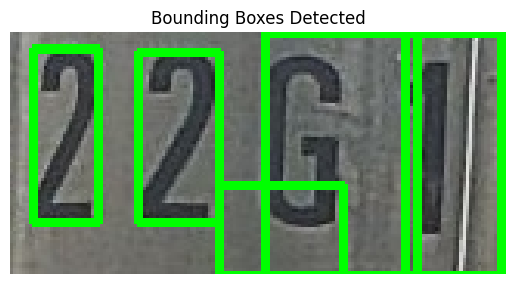

The image is horizontal


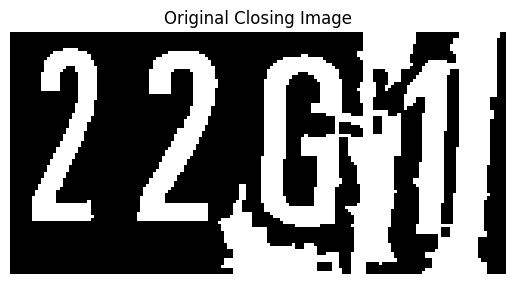

Original closing image saved as 'labeled_samples\145327001\1-145327001-OCR-LB-C02\1-145327001-OCR-LB-C02_reconst_2_class1.jpg'
Saved: labeled_samples\145327001\1-145327001-OCR-LB-C02\1-145327001-OCR-LB-C02_reconst_2_class1.jpg
Mean value of the binary image: 128.9320652173913


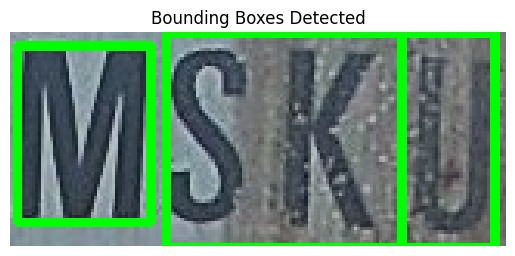

The image is horizontal


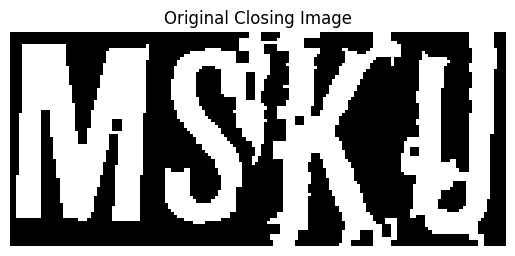

Original closing image saved as 'labeled_samples\145327001\1-145327001-OCR-LF-C01\1-145327001-OCR-LF-C01_reconst_0_class1.jpg'
Saved: labeled_samples\145327001\1-145327001-OCR-LF-C01\1-145327001-OCR-LF-C01_reconst_0_class1.jpg
Mean value of the binary image: 128.2248399487836


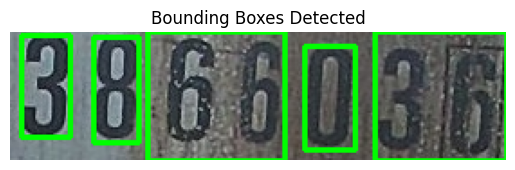

The image is horizontal


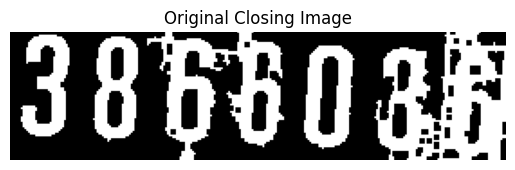

Original closing image saved as 'labeled_samples\145327001\1-145327001-OCR-LF-C01\1-145327001-OCR-LF-C01_reconst_1_class-1.jpg'
Saved: labeled_samples\145327001\1-145327001-OCR-LF-C01\1-145327001-OCR-LF-C01_reconst_1_class-1.jpg
Mean value of the binary image: 139.15395823215152


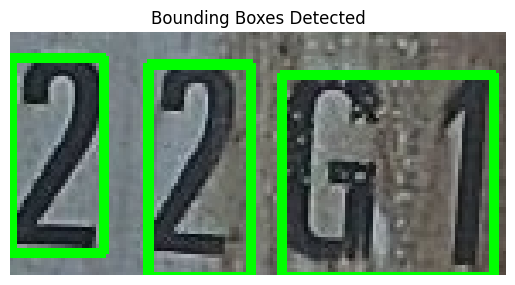

The image is horizontal


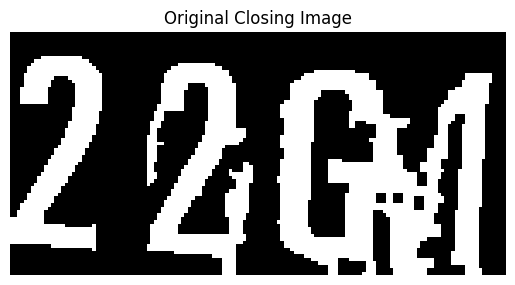

Original closing image saved as 'labeled_samples\145327001\1-145327001-OCR-LF-C01\1-145327001-OCR-LF-C01_reconst_2_class1.jpg'
Saved: labeled_samples\145327001\1-145327001-OCR-LF-C01\1-145327001-OCR-LF-C01_reconst_2_class1.jpg
Mean value of the binary image: 151.36440360090023


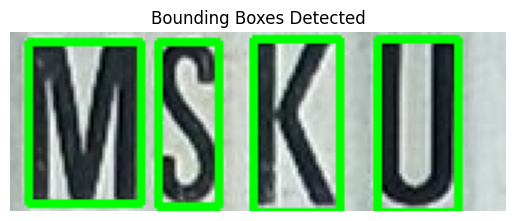

The image is horizontal


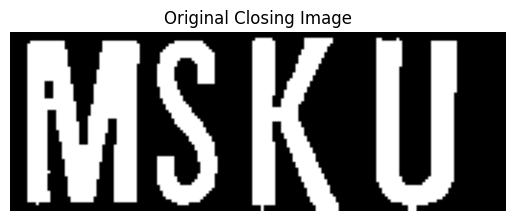

Original closing image saved as 'labeled_samples\145327001\1-145327001-OCR-RF-D01\1-145327001-OCR-RF-D01_reconst_0_class1.jpg'
Saved: labeled_samples\145327001\1-145327001-OCR-RF-D01\1-145327001-OCR-RF-D01_reconst_0_class1.jpg
Mean value of the binary image: 159.8779317697228


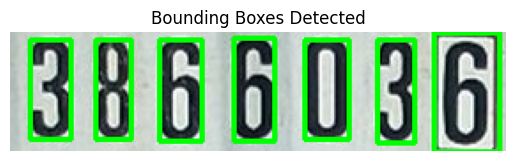

The image is horizontal


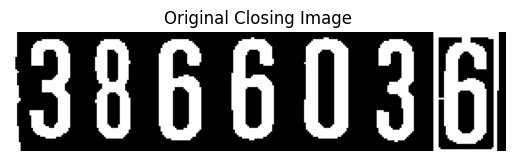

Original closing image saved as 'labeled_samples\145327001\1-145327001-OCR-RF-D01\1-145327001-OCR-RF-D01_reconst_1_class-1.jpg'
Saved: labeled_samples\145327001\1-145327001-OCR-RF-D01\1-145327001-OCR-RF-D01_reconst_1_class-1.jpg
Mean value of the binary image: 167.25340136054422


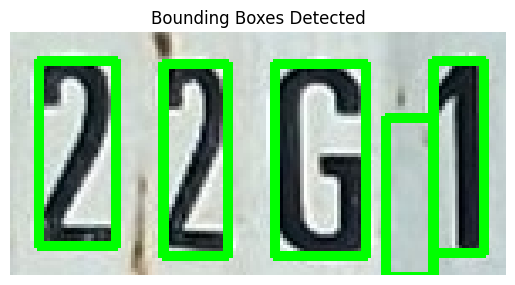

The image is horizontal


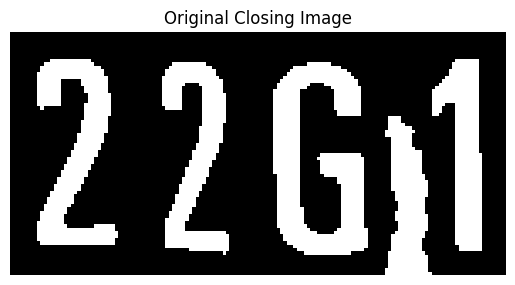

Original closing image saved as 'labeled_samples\145327001\1-145327001-OCR-RF-D01\1-145327001-OCR-RF-D01_reconst_2_class1.jpg'
Saved: labeled_samples\145327001\1-145327001-OCR-RF-D01\1-145327001-OCR-RF-D01_reconst_2_class1.jpg
Mean value of the binary image: 63.52647530754145


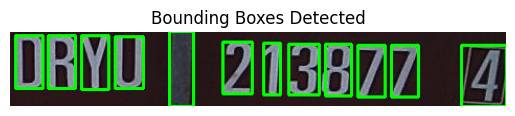

The image is horizontal


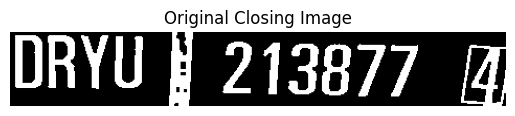

Original closing image saved as 'labeled_samples\150224001\1-150224001-OCR-AH-A01\1-150224001-OCR-AH-A01_reconst_0_class0.jpg'
Saved: labeled_samples\150224001\1-150224001-OCR-AH-A01\1-150224001-OCR-AH-A01_reconst_0_class0.jpg
Mean value of the binary image: 79.53412073490814


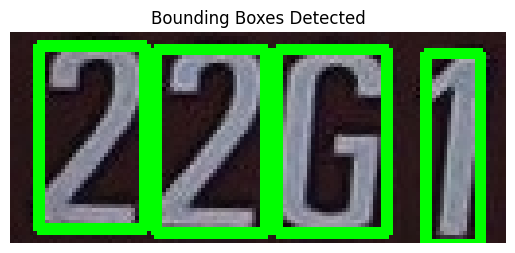

The image is horizontal


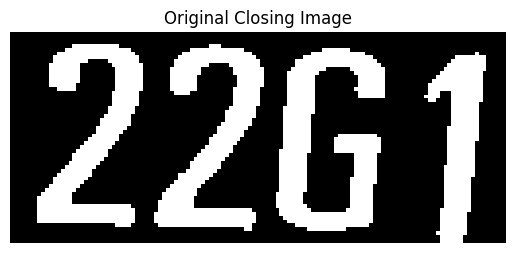

Original closing image saved as 'labeled_samples\150224001\1-150224001-OCR-AH-A01\1-150224001-OCR-AH-A01_reconst_1_class1.jpg'
Saved: labeled_samples\150224001\1-150224001-OCR-AH-A01\1-150224001-OCR-AH-A01_reconst_1_class1.jpg
Mean value of the binary image: 97.27967806841046


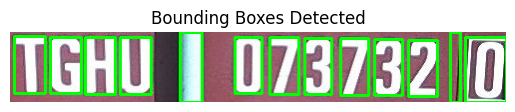

The image is horizontal


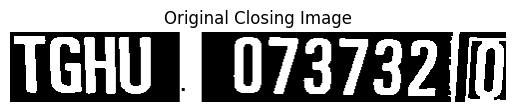

Original closing image saved as 'labeled_samples\150224001\1-150224001-OCR-AS-B01\1-150224001-OCR-AS-B01_reconst_0_class0.jpg'
Saved: labeled_samples\150224001\1-150224001-OCR-AS-B01\1-150224001-OCR-AS-B01_reconst_0_class0.jpg
Mean value of the binary image: 98.994140625


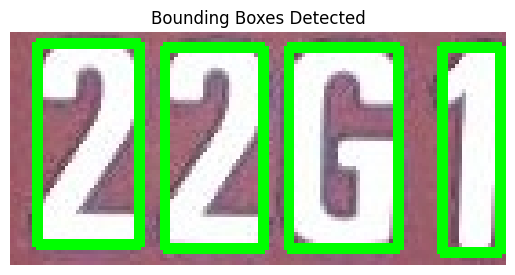

The image is horizontal


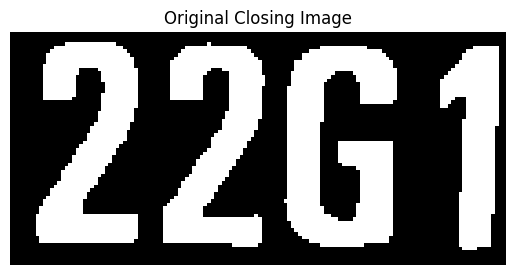

Original closing image saved as 'labeled_samples\150224001\1-150224001-OCR-AS-B01\1-150224001-OCR-AS-B01_reconst_1_class1.jpg'
Saved: labeled_samples\150224001\1-150224001-OCR-AS-B01\1-150224001-OCR-AS-B01_reconst_1_class1.jpg
Mean value of the binary image: 66.33263289413902


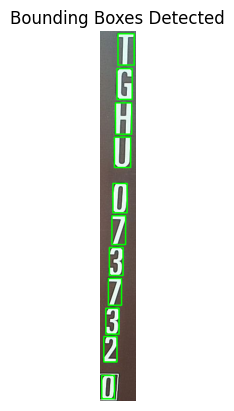

The image is vertical, resizing to horizontal orientation.


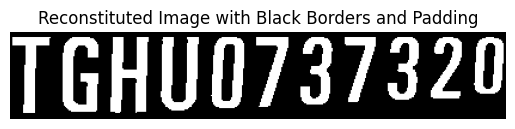

Reconstituted image saved as 'labeled_samples\150224001\1-150224001-OCR-LB-C02\1-150224001-OCR-LB-C02_reconst_0_class0.jpg'
Saved: labeled_samples\150224001\1-150224001-OCR-LB-C02\1-150224001-OCR-LB-C02_reconst_0_class0.jpg
Mean value of the binary image: 66.10590182018754


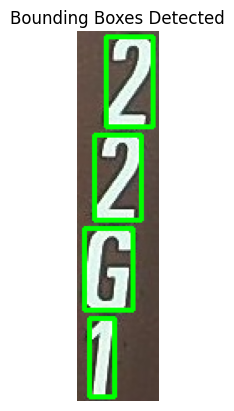

The image is vertical, resizing to horizontal orientation.


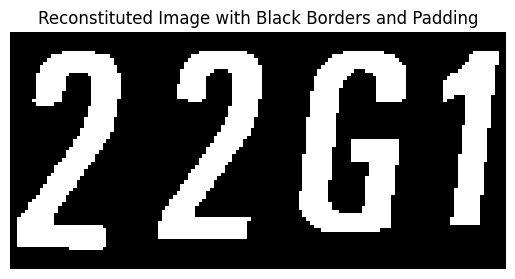

Reconstituted image saved as 'labeled_samples\150224001\1-150224001-OCR-LB-C02\1-150224001-OCR-LB-C02_reconst_1_class1.jpg'
Saved: labeled_samples\150224001\1-150224001-OCR-LB-C02\1-150224001-OCR-LB-C02_reconst_1_class1.jpg
Mean value of the binary image: 58.88927097661623


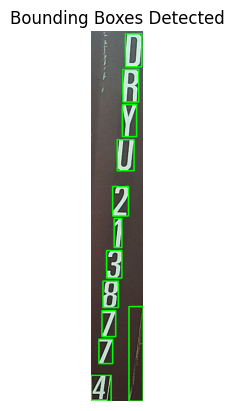

The image is vertical, resizing to horizontal orientation.


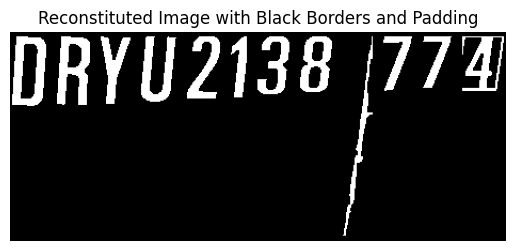

Reconstituted image saved as 'labeled_samples\150224001\1-150224001-OCR-LF-C01\1-150224001-OCR-LF-C01_reconst_0_class0.jpg'
Saved: labeled_samples\150224001\1-150224001-OCR-LF-C01\1-150224001-OCR-LF-C01_reconst_0_class0.jpg
Mean value of the binary image: 70.74588477366255


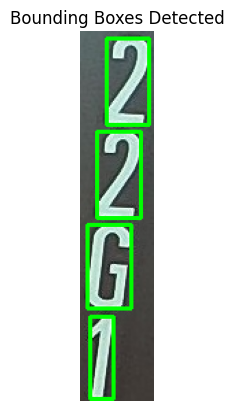

The image is vertical, resizing to horizontal orientation.


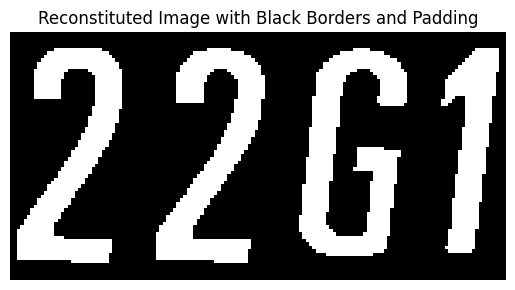

Reconstituted image saved as 'labeled_samples\150224001\1-150224001-OCR-LF-C01\1-150224001-OCR-LF-C01_reconst_1_class1.jpg'
Saved: labeled_samples\150224001\1-150224001-OCR-LF-C01\1-150224001-OCR-LF-C01_reconst_1_class1.jpg
Mean value of the binary image: 81.6


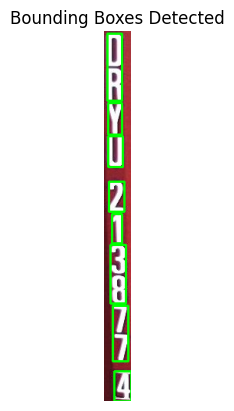

The image is vertical, resizing to horizontal orientation.


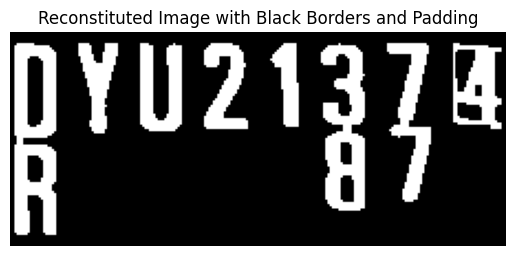

Reconstituted image saved as 'labeled_samples\150224001\1-150224001-OCR-RF-D01\1-150224001-OCR-RF-D01_reconst_0_class0.jpg'
Saved: labeled_samples\150224001\1-150224001-OCR-RF-D01\1-150224001-OCR-RF-D01_reconst_0_class0.jpg
Mean value of the binary image: 92.63988095238095


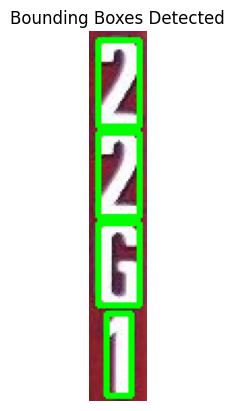

The image is vertical, resizing to horizontal orientation.


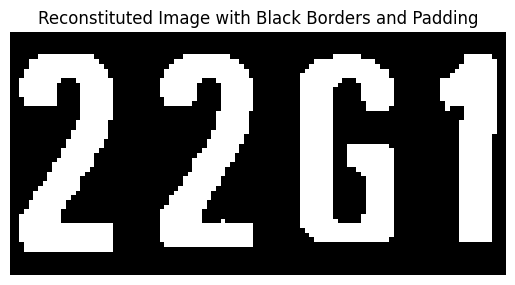

Reconstituted image saved as 'labeled_samples\150224001\1-150224001-OCR-RF-D01\1-150224001-OCR-RF-D01_reconst_1_class1.jpg'
Saved: labeled_samples\150224001\1-150224001-OCR-RF-D01\1-150224001-OCR-RF-D01_reconst_1_class1.jpg
Mean value of the binary image: 68.08381779380382


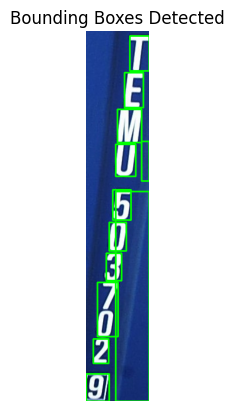

The image is vertical, resizing to horizontal orientation.


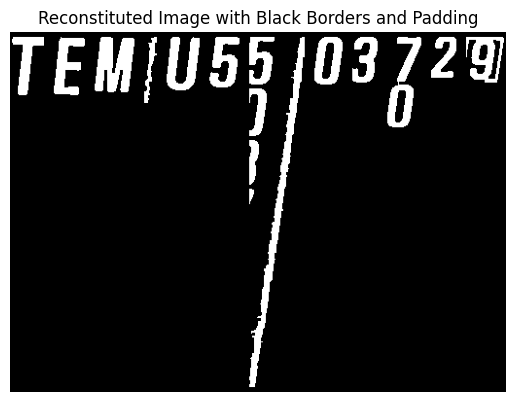

Reconstituted image saved as 'labeled_samples\152733001\1-152733001-OCR-AH-A01\1-152733001-OCR-AH-A01_reconst_0_class0.jpg'
Saved: labeled_samples\152733001\1-152733001-OCR-AH-A01\1-152733001-OCR-AH-A01_reconst_0_class0.jpg
Mean value of the binary image: 97.75770206596593


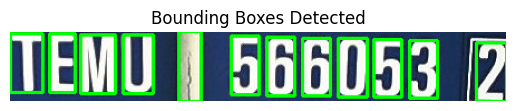

The image is horizontal


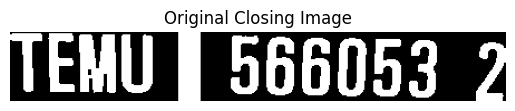

Original closing image saved as 'labeled_samples\152733001\1-152733001-OCR-AS-B01\1-152733001-OCR-AS-B01_reconst_0_class0.jpg'
Saved: labeled_samples\152733001\1-152733001-OCR-AS-B01\1-152733001-OCR-AS-B01_reconst_0_class0.jpg
Mean value of the binary image: 94.92227247032221


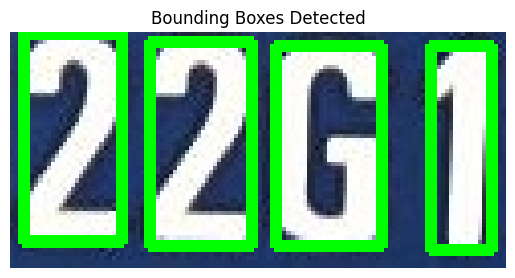

The image is horizontal


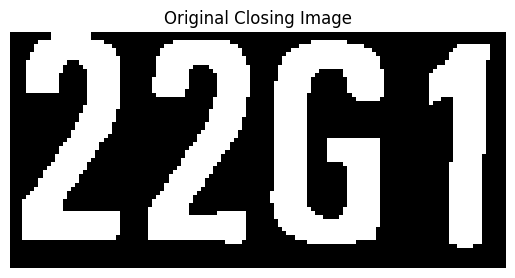

Original closing image saved as 'labeled_samples\152733001\1-152733001-OCR-AS-B01\1-152733001-OCR-AS-B01_reconst_1_class1.jpg'
Saved: labeled_samples\152733001\1-152733001-OCR-AS-B01\1-152733001-OCR-AS-B01_reconst_1_class1.jpg
Mean value of the binary image: 70.00685693106004


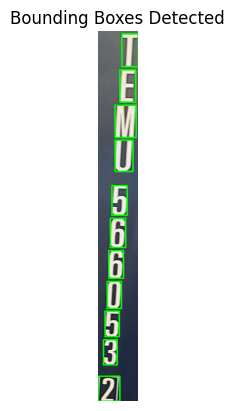

The image is vertical, resizing to horizontal orientation.


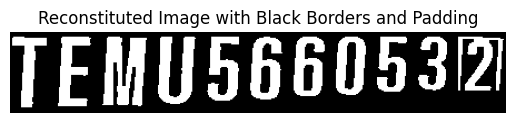

Reconstituted image saved as 'labeled_samples\152733001\1-152733001-OCR-LB-C02\1-152733001-OCR-LB-C02_reconst_0_class0.jpg'
Saved: labeled_samples\152733001\1-152733001-OCR-LB-C02\1-152733001-OCR-LB-C02_reconst_0_class0.jpg
Mean value of the binary image: 71.72489804915683


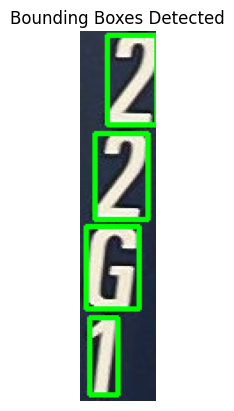

The image is vertical, resizing to horizontal orientation.


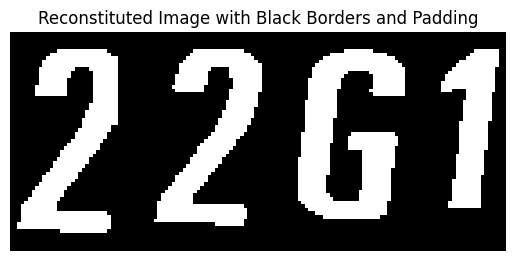

Reconstituted image saved as 'labeled_samples\152733001\1-152733001-OCR-LB-C02\1-152733001-OCR-LB-C02_reconst_1_class1.jpg'
Saved: labeled_samples\152733001\1-152733001-OCR-LB-C02\1-152733001-OCR-LB-C02_reconst_1_class1.jpg
Mean value of the binary image: 69.05662983425414


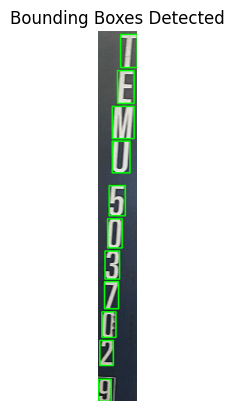

The image is vertical, resizing to horizontal orientation.


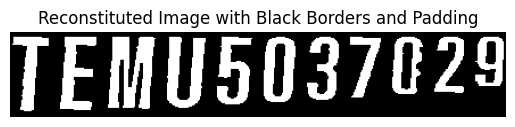

Reconstituted image saved as 'labeled_samples\152733001\1-152733001-OCR-LF-C01\1-152733001-OCR-LF-C01_reconst_0_class0.jpg'
Saved: labeled_samples\152733001\1-152733001-OCR-LF-C01\1-152733001-OCR-LF-C01_reconst_0_class0.jpg
Mean value of the binary image: 73.69266055045871


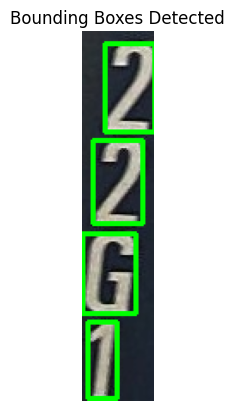

The image is vertical, resizing to horizontal orientation.


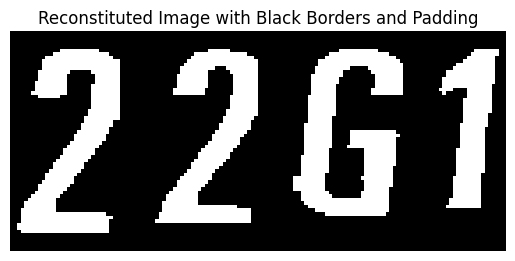

Reconstituted image saved as 'labeled_samples\152733001\1-152733001-OCR-LF-C01\1-152733001-OCR-LF-C01_reconst_1_class1.jpg'
Saved: labeled_samples\152733001\1-152733001-OCR-LF-C01\1-152733001-OCR-LF-C01_reconst_1_class1.jpg
Mean value of the binary image: 82.13752289699873


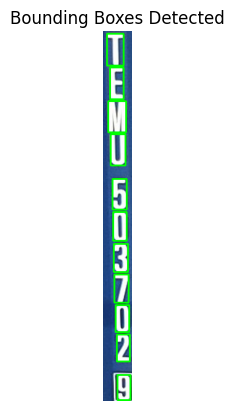

The image is vertical, resizing to horizontal orientation.


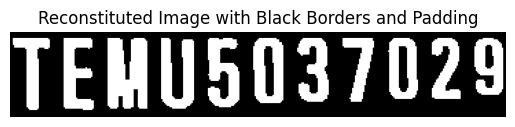

Reconstituted image saved as 'labeled_samples\152733001\1-152733001-OCR-RF-D01\1-152733001-OCR-RF-D01_reconst_0_class0.jpg'
Saved: labeled_samples\152733001\1-152733001-OCR-RF-D01\1-152733001-OCR-RF-D01_reconst_0_class0.jpg
Mean value of the binary image: 82.91836734693878


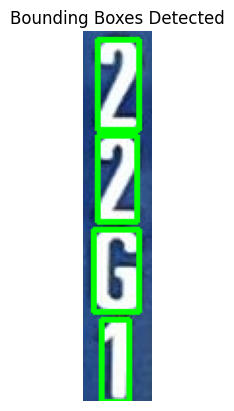

The image is vertical, resizing to horizontal orientation.


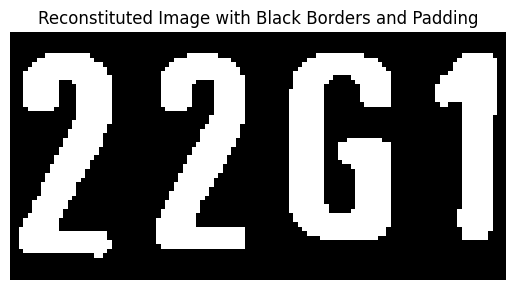

Reconstituted image saved as 'labeled_samples\152733001\1-152733001-OCR-RF-D01\1-152733001-OCR-RF-D01_reconst_1_class1.jpg'
Saved: labeled_samples\152733001\1-152733001-OCR-RF-D01\1-152733001-OCR-RF-D01_reconst_1_class1.jpg
Mean value of the binary image: 96.92234848484848


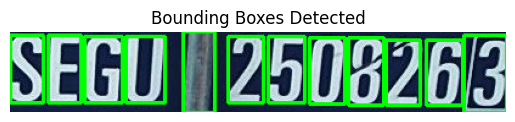

The image is horizontal


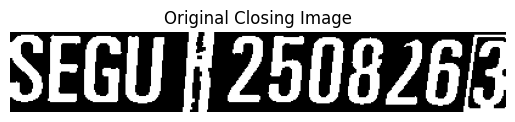

Original closing image saved as 'labeled_samples\153458001\1-153458001-OCR-AH-A01\1-153458001-OCR-AH-A01_reconst_0_class0.jpg'
Saved: labeled_samples\153458001\1-153458001-OCR-AH-A01\1-153458001-OCR-AH-A01_reconst_0_class0.jpg
Mean value of the binary image: 94.52586206896552


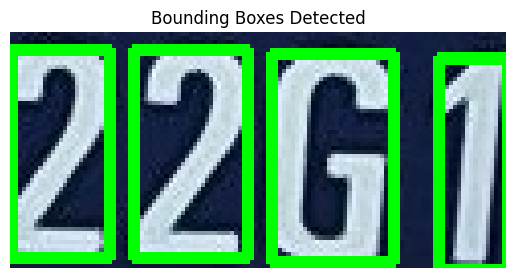

The image is horizontal


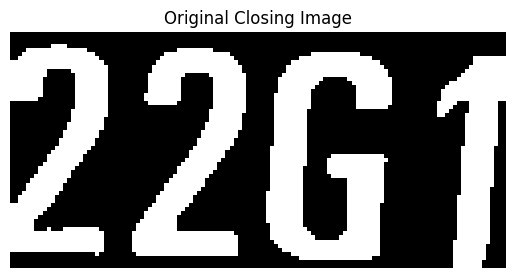

Original closing image saved as 'labeled_samples\153458001\1-153458001-OCR-AH-A01\1-153458001-OCR-AH-A01_reconst_1_class1.jpg'
Saved: labeled_samples\153458001\1-153458001-OCR-AH-A01\1-153458001-OCR-AH-A01_reconst_1_class1.jpg
Mean value of the binary image: 94.54780618843895


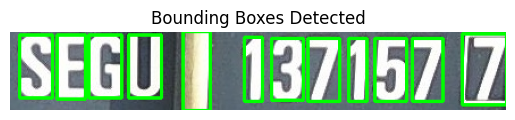

The image is horizontal


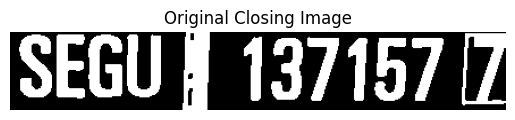

Original closing image saved as 'labeled_samples\153458001\1-153458001-OCR-AS-B01\1-153458001-OCR-AS-B01_reconst_0_class0.jpg'
Saved: labeled_samples\153458001\1-153458001-OCR-AS-B01\1-153458001-OCR-AS-B01_reconst_0_class0.jpg
Mean value of the binary image: 95.28643036161833


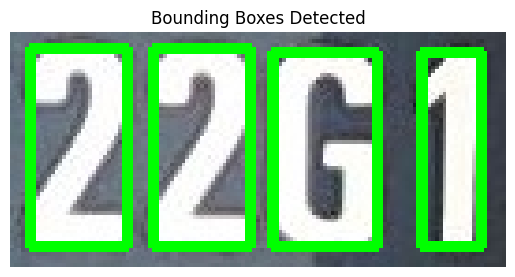

The image is horizontal


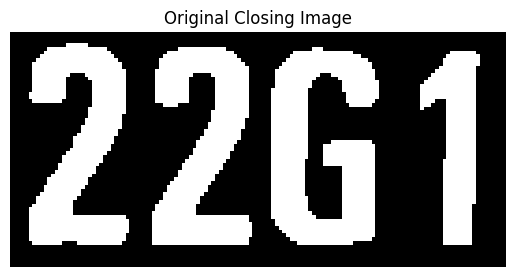

Original closing image saved as 'labeled_samples\153458001\1-153458001-OCR-AS-B01\1-153458001-OCR-AS-B01_reconst_1_class1.jpg'
Saved: labeled_samples\153458001\1-153458001-OCR-AS-B01\1-153458001-OCR-AS-B01_reconst_1_class1.jpg
Mean value of the binary image: 70.79870046320123


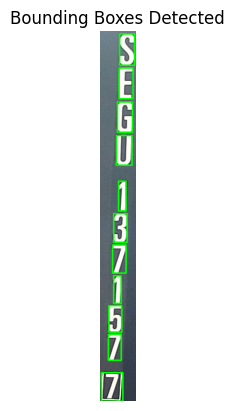

The image is vertical, resizing to horizontal orientation.


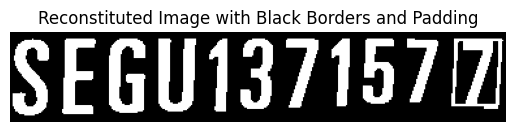

Reconstituted image saved as 'labeled_samples\153458001\1-153458001-OCR-LB-C02\1-153458001-OCR-LB-C02_reconst_0_class0.jpg'
Saved: labeled_samples\153458001\1-153458001-OCR-LB-C02\1-153458001-OCR-LB-C02_reconst_0_class0.jpg
Mean value of the binary image: 82.87303058387396


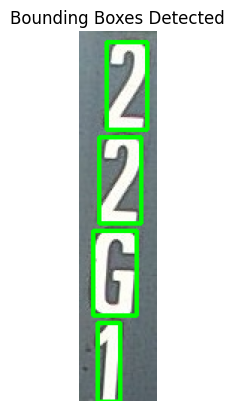

The image is vertical, resizing to horizontal orientation.


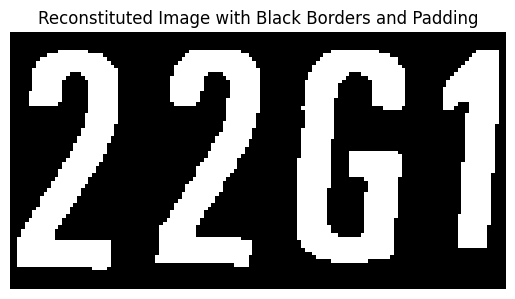

Reconstituted image saved as 'labeled_samples\153458001\1-153458001-OCR-LB-C02\1-153458001-OCR-LB-C02_reconst_1_class1.jpg'
Saved: labeled_samples\153458001\1-153458001-OCR-LB-C02\1-153458001-OCR-LB-C02_reconst_1_class1.jpg
Mean value of the binary image: 68.04346643455554


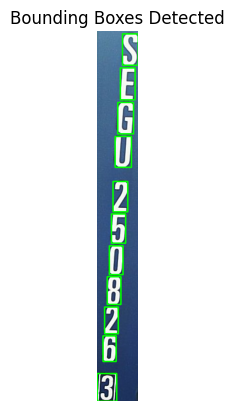

The image is vertical, resizing to horizontal orientation.


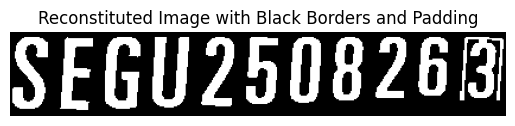

Reconstituted image saved as 'labeled_samples\153458001\1-153458001-OCR-LF-C01\1-153458001-OCR-LF-C01_reconst_0_class0.jpg'
Saved: labeled_samples\153458001\1-153458001-OCR-LF-C01\1-153458001-OCR-LF-C01_reconst_0_class0.jpg
Mean value of the binary image: 77.87231663685152


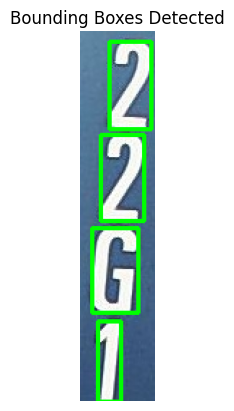

The image is vertical, resizing to horizontal orientation.


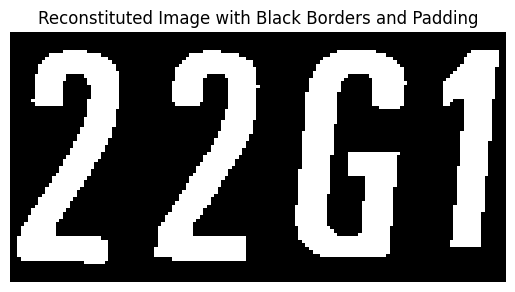

Reconstituted image saved as 'labeled_samples\153458001\1-153458001-OCR-LF-C01\1-153458001-OCR-LF-C01_reconst_1_class1.jpg'
Saved: labeled_samples\153458001\1-153458001-OCR-LF-C01\1-153458001-OCR-LF-C01_reconst_1_class1.jpg
Mean value of the binary image: 87.46776147050441


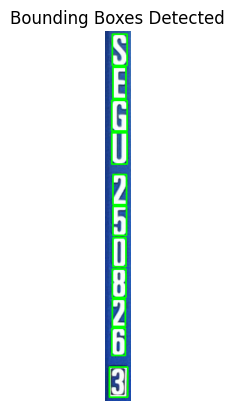

The image is vertical, resizing to horizontal orientation.


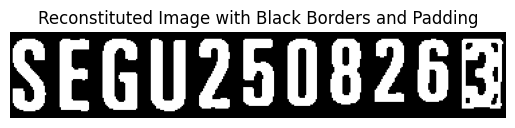

Reconstituted image saved as 'labeled_samples\153458001\1-153458001-OCR-RF-D01\1-153458001-OCR-RF-D01_reconst_0_class0.jpg'
Saved: labeled_samples\153458001\1-153458001-OCR-RF-D01\1-153458001-OCR-RF-D01_reconst_0_class0.jpg
Mean value of the binary image: 91.74860022396416


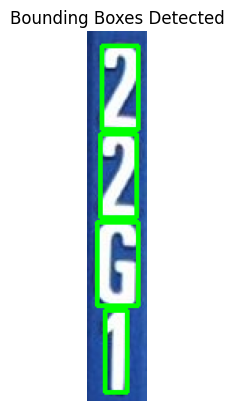

The image is vertical, resizing to horizontal orientation.


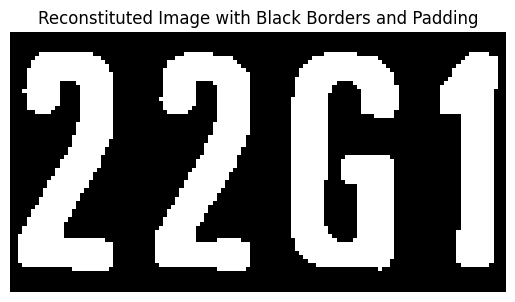

Reconstituted image saved as 'labeled_samples\153458001\1-153458001-OCR-RF-D01\1-153458001-OCR-RF-D01_reconst_1_class1.jpg'
Saved: labeled_samples\153458001\1-153458001-OCR-RF-D01\1-153458001-OCR-RF-D01_reconst_1_class1.jpg


In [25]:
import os
import cv2

def process_and_reconstitute_all(labeled_samples_dir="labeled_samples"):
    """
    For each id and each labeled image subfolder, reconstitute all crops and save the result.
    """
    for img_id in os.listdir(labeled_samples_dir):
        id_folder = os.path.join(labeled_samples_dir, img_id)
        if not os.path.isdir(id_folder):
            continue
        for labeled_image_subfolder in os.listdir(id_folder):
            subfolder_path = os.path.join(id_folder, labeled_image_subfolder)
            if not os.path.isdir(subfolder_path):
                continue
            # Collect all crop images in this subfolder
            crop_files = [f for f in os.listdir(subfolder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png')) and '_crop_' in f]
            if not crop_files:
                continue
            # Sort crop files by index in filename for consistent order
            crop_files.sort(key=lambda x: int(x.split('_crop_')[1].split('_')[0]))
            # For each crop, apply adaptive threshold and get bounding rects
            for idx, crop_file in enumerate(crop_files):
                crop_path = os.path.join(subfolder_path, crop_file)
                # Use adaptive threshold and filter to get bounding boxes
                closingImage, boundRect = adaptive_threshold_and_filter(crop_path)
                # Reconstitute the character(s) in this crop
                if boundRect:
                    # Extract class id from filename
                    class_id = crop_file.split('class')[-1].split('.')[0]
                    save_name = f"{labeled_image_subfolder}_reconst_{idx}_class{class_id}.jpg"
                    save_path = os.path.join(subfolder_path, save_name)
                    reconstitute_characters_with_padding(closingImage, boundRect, save_path=save_path)
                    print(f"Saved: {save_path}")

# Run the process
process_and_reconstitute_all("labeled_samples")

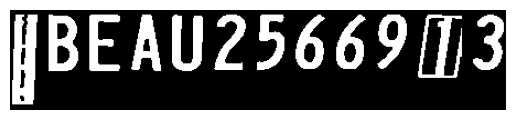

labeled_samples\124126001\1-124126001-OCR-AH-A01\1-124126001-OCR-AH-A01_reconst_0_class0.jpg: PBEAU 25669 (1/3


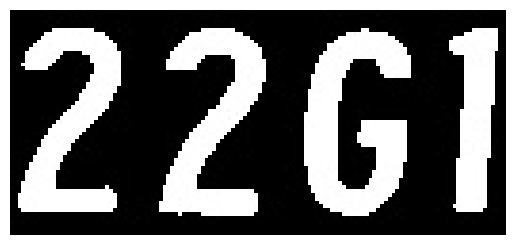

labeled_samples\124126001\1-124126001-OCR-AH-A01\1-124126001-OCR-AH-A01_reconst_1_class1.jpg: 22G6l


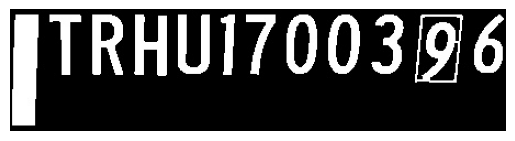

labeled_samples\124126001\1-124126001-OCR-AS-B01\1-124126001-OCR-AS-B01_reconst_0_class0.jpg: JIRHUI70039'6


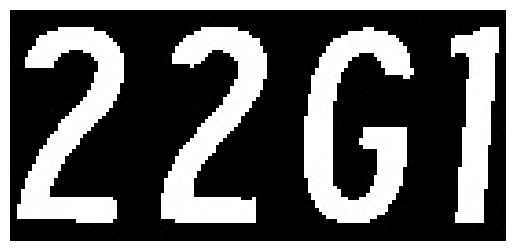

labeled_samples\124126001\1-124126001-OCR-AS-B01\1-124126001-OCR-AS-B01_reconst_1_class1.jpg: 2261


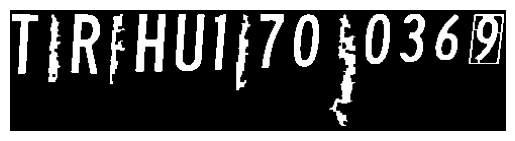

labeled_samples\124126001\1-124126001-OCR-LB-C02\1-124126001-OCR-LB-C02_reconst_0_class0.jpg: TIRFHUT/70 50369


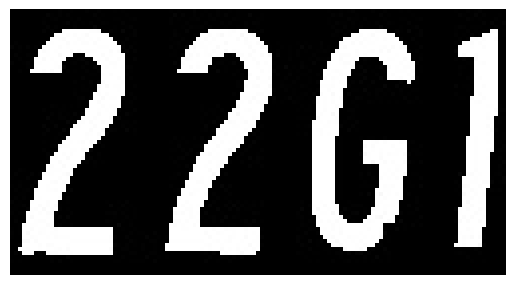

labeled_samples\124126001\1-124126001-OCR-LB-C02\1-124126001-OCR-LB-C02_reconst_1_class1.jpg: 2261


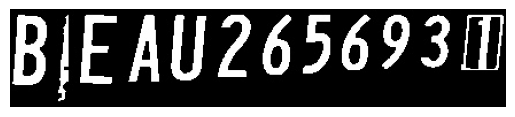

labeled_samples\124126001\1-124126001-OCR-LF-C01\1-124126001-OCR-LF-C01_reconst_0_class0.jpg: BIE AU26569311


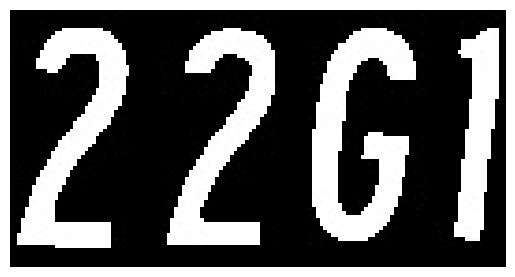

labeled_samples\124126001\1-124126001-OCR-LF-C01\1-124126001-OCR-LF-C01_reconst_1_class1.jpg: 2261


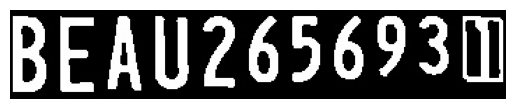

labeled_samples\124126001\1-124126001-OCR-RF-D01\1-124126001-OCR-RF-D01_reconst_0_class0.jpg: BEAU2656930


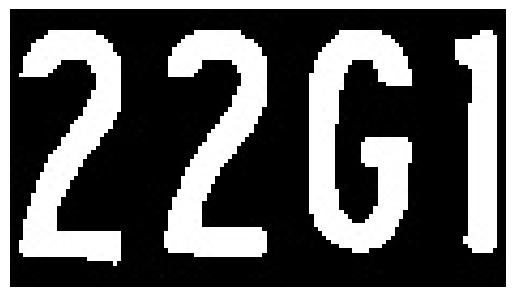

labeled_samples\124126001\1-124126001-OCR-RF-D01\1-124126001-OCR-RF-D01_reconst_1_class1.jpg: 2261


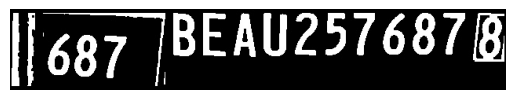

labeled_samples\124835001\1-124835001-OCR-AH-A01\1-124835001-OCR-AH-A01_reconst_0_class0.jpg: l6g7 [BEAUZ5/6876


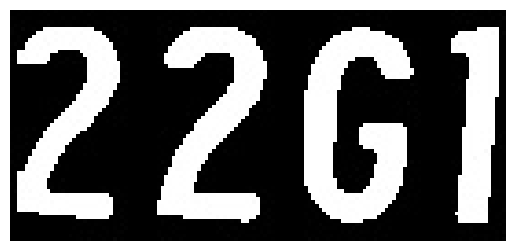

labeled_samples\124835001\1-124835001-OCR-AH-A01\1-124835001-OCR-AH-A01_reconst_1_class1.jpg: 2261


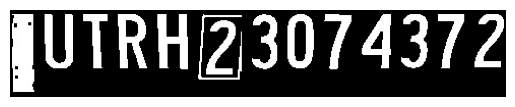

labeled_samples\124835001\1-124835001-OCR-AS-B01\1-124835001-OCR-AS-B01_reconst_0_class0.jpg: QUTRH/2)3074372


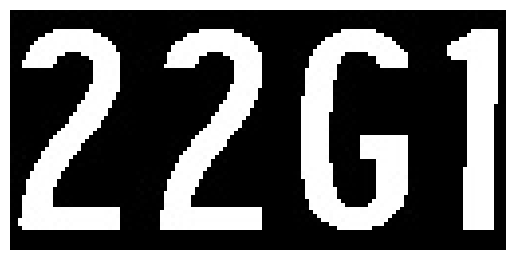

labeled_samples\124835001\1-124835001-OCR-AS-B01\1-124835001-OCR-AS-B01_reconst_1_class1.jpg: 2261


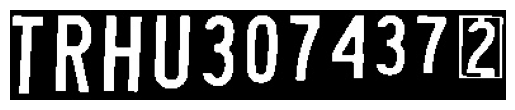

labeled_samples\124835001\1-124835001-OCR-LB-C02\1-124835001-OCR-LB-C02_reconst_0_class0.jpg: TRHU30743712


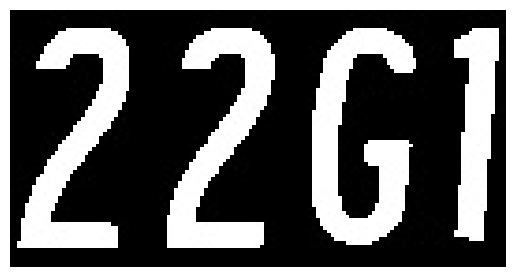

labeled_samples\124835001\1-124835001-OCR-LB-C02\1-124835001-OCR-LB-C02_reconst_1_class1.jpg: 22G6l


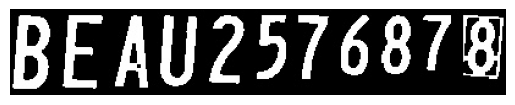

labeled_samples\124835001\1-124835001-OCR-LF-C01\1-124835001-OCR-LF-C01_reconst_0_class0.jpg: BE AU2576878


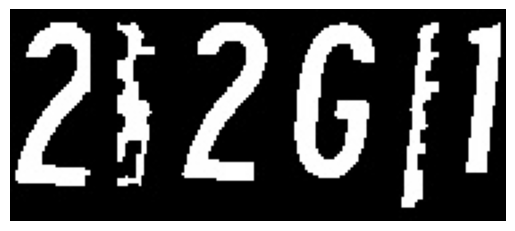

labeled_samples\124835001\1-124835001-OCR-LF-C01\1-124835001-OCR-LF-C01_reconst_1_class1.jpg: 2326} 1


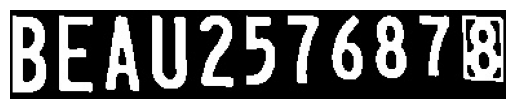

labeled_samples\124835001\1-124835001-OCR-RF-D01\1-124835001-OCR-RF-D01_reconst_0_class0.jpg: BEAU25 76878


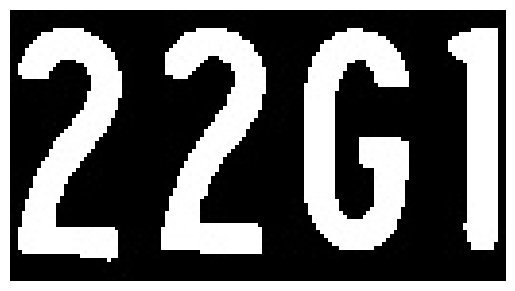

labeled_samples\124835001\1-124835001-OCR-RF-D01\1-124835001-OCR-RF-D01_reconst_1_class1.jpg: 2261


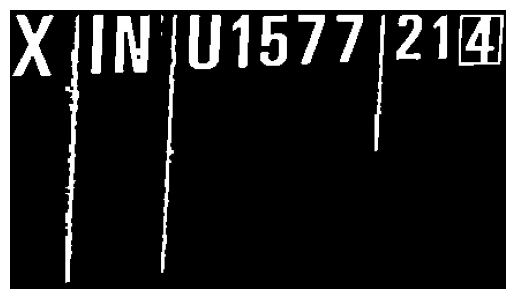

labeled_samples\125722001\1-125722001-OCR-AH-A01\1-125722001-OCR-AH-A01_reconst_0_class0.jpg: yl


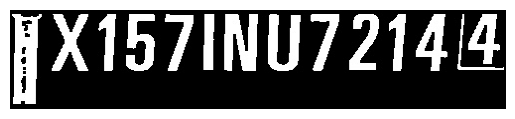

labeled_samples\125722001\1-125722001-OCR-AS-B01\1-125722001-OCR-AS-B01_reconst_0_class0.jpg: X15 7INU7 21414


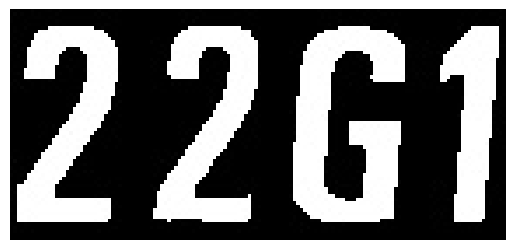

labeled_samples\125722001\1-125722001-OCR-AS-B01\1-125722001-OCR-AS-B01_reconst_1_class1.jpg: 2261


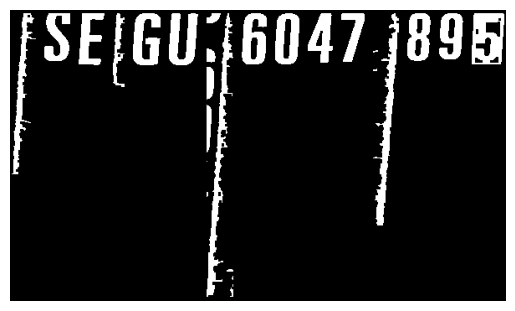

labeled_samples\125722001\1-125722001-OCR-LB-C02\1-125722001-OCR-LB-C02_reconst_0_class0.jpg: ary


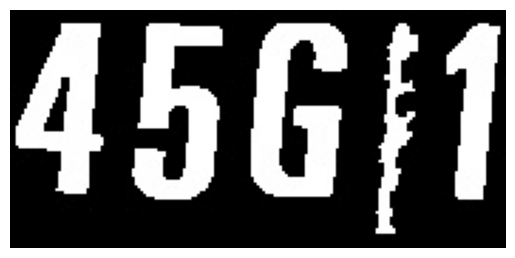

labeled_samples\125722001\1-125722001-OCR-LB-C02\1-125722001-OCR-LB-C02_reconst_1_class1.jpg: 45G}1


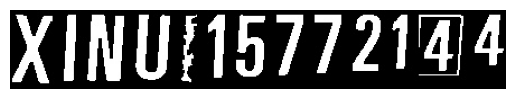

labeled_samples\125722001\1-125722001-OCR-LF-C01\1-125722001-OCR-LF-C01_reconst_0_class0.jpg: XINUE157721'4/4


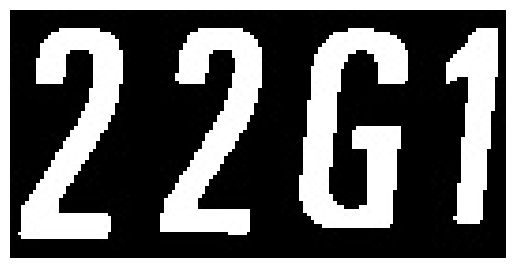

labeled_samples\125722001\1-125722001-OCR-LF-C01\1-125722001-OCR-LF-C01_reconst_1_class1.jpg: 22641


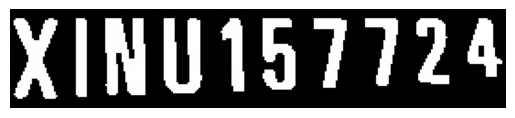

labeled_samples\125722001\1-125722001-OCR-RF-D01\1-125722001-OCR-RF-D01_reconst_0_class0.jpg: XINU157724


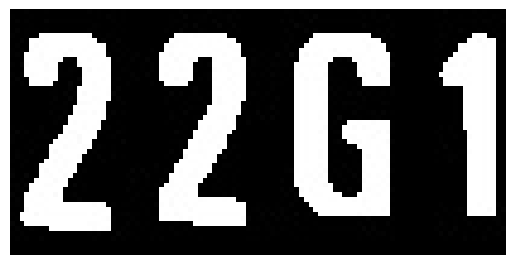

labeled_samples\125722001\1-125722001-OCR-RF-D01\1-125722001-OCR-RF-D01_reconst_1_class1.jpg: 22G1


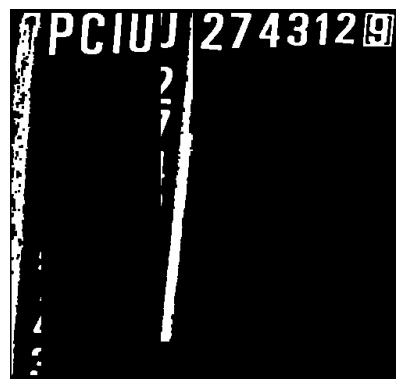

labeled_samples\130713001\1-130713001-OCR-AH-A01\1-130713001-OCR-AH-A01_reconst_0_class0.jpg: Py


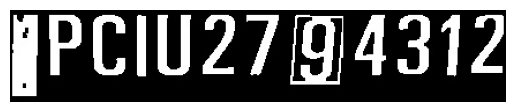

labeled_samples\130713001\1-130713001-OCR-AS-B01\1-130713001-OCR-AS-B01_reconst_0_class0.jpg: gPCIU27 (9/4312


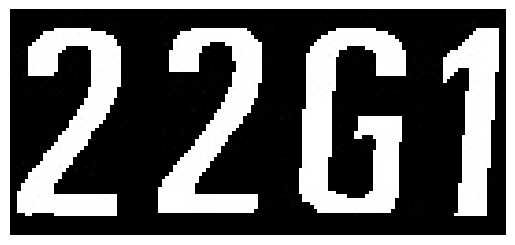

labeled_samples\130713001\1-130713001-OCR-AS-B01\1-130713001-OCR-AS-B01_reconst_1_class1.jpg: 2261


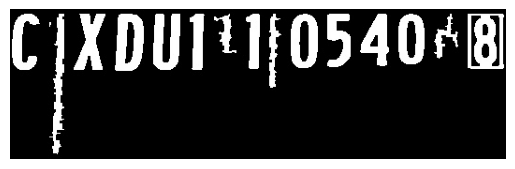

labeled_samples\130713001\1-130713001-OCR-LB-C02\1-130713001-OCR-LB-C02_reconst_0_class0.jpg: + Oo


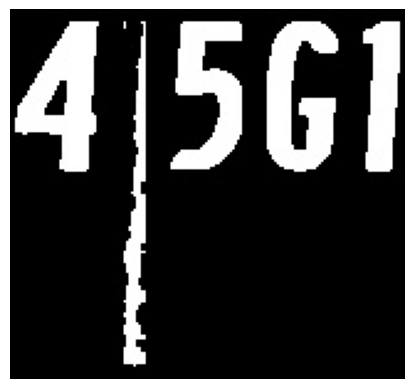

labeled_samples\130713001\1-130713001-OCR-LB-C02\1-130713001-OCR-LB-C02_reconst_1_class1.jpg: 46!


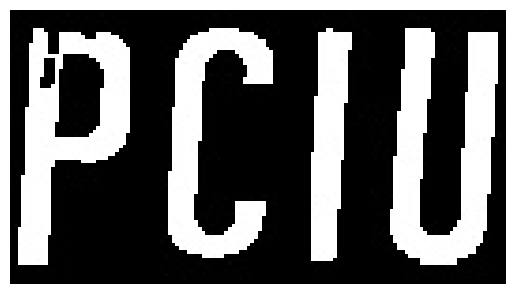

labeled_samples\130713001\1-130713001-OCR-LF-C01\1-130713001-OCR-LF-C01_reconst_0_class1.jpg: PCIU


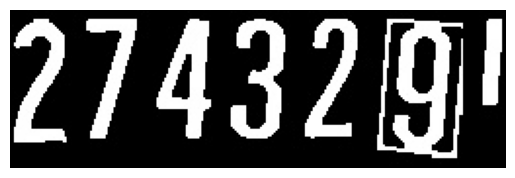

labeled_samples\130713001\1-130713001-OCR-LF-C01\1-130713001-OCR-LF-C01_reconst_1_class-1.jpg: 27432/g|


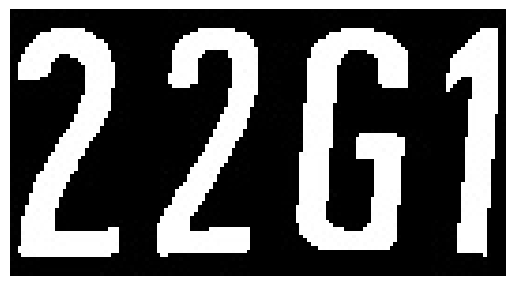

labeled_samples\130713001\1-130713001-OCR-LF-C01\1-130713001-OCR-LF-C01_reconst_2_class1.jpg: 2261


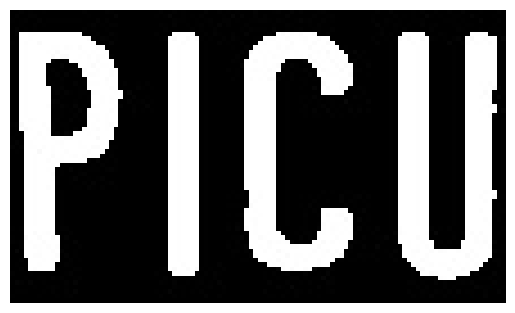

labeled_samples\130713001\1-130713001-OCR-RF-D01\1-130713001-OCR-RF-D01_reconst_0_class1.jpg: PICU


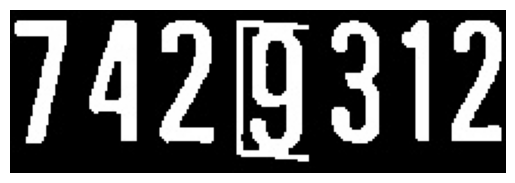

labeled_samples\130713001\1-130713001-OCR-RF-D01\1-130713001-OCR-RF-D01_reconst_1_class-1.jpg: 74219312


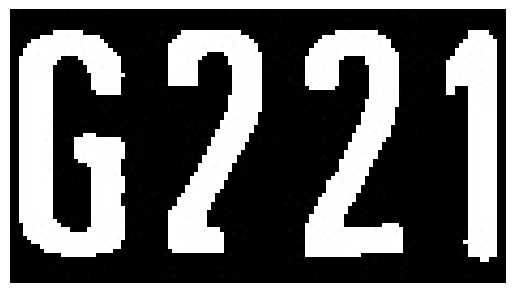

labeled_samples\130713001\1-130713001-OCR-RF-D01\1-130713001-OCR-RF-D01_reconst_2_class1.jpg: 6221


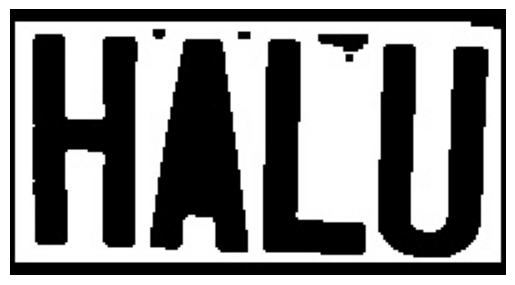

labeled_samples\142900001\1-142900001-OCR-AH-A01\1-142900001-OCR-AH-A01_reconst_0_class1.jpg: 


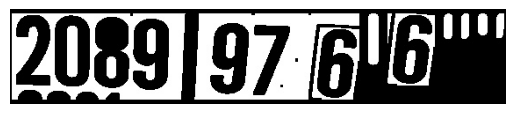

labeled_samples\142900001\1-142900001-OCR-AH-A01\1-142900001-OCR-AH-A01_reconst_1_class-1.jpg: 2089} 97 Gu6me


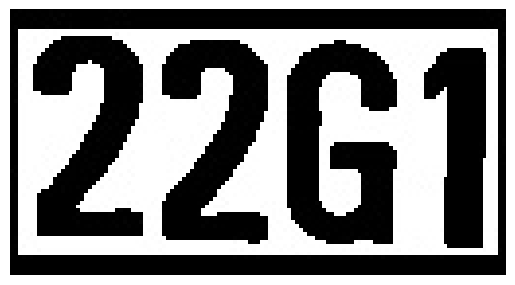

labeled_samples\142900001\1-142900001-OCR-AH-A01\1-142900001-OCR-AH-A01_reconst_2_class1.jpg: 22G1


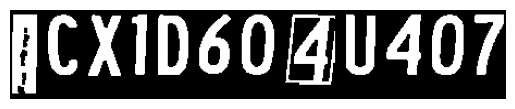

labeled_samples\142900001\1-142900001-OCR-AS-B01\1-142900001-OCR-AS-B01_reconst_0_class0.jpg: fCX1D60/4U407


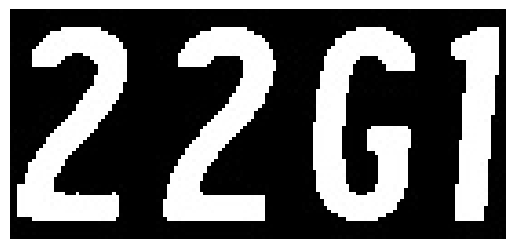

labeled_samples\142900001\1-142900001-OCR-AS-B01\1-142900001-OCR-AS-B01_reconst_1_class1.jpg: 226i


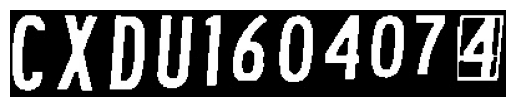

labeled_samples\142900001\1-142900001-OCR-LB-C02\1-142900001-OCR-LB-C02_reconst_0_class0.jpg: CXDUI604074


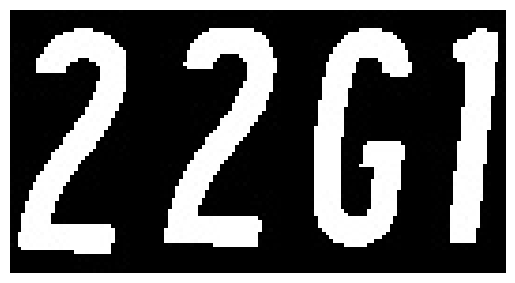

labeled_samples\142900001\1-142900001-OCR-LB-C02\1-142900001-OCR-LB-C02_reconst_1_class1.jpg: 226i


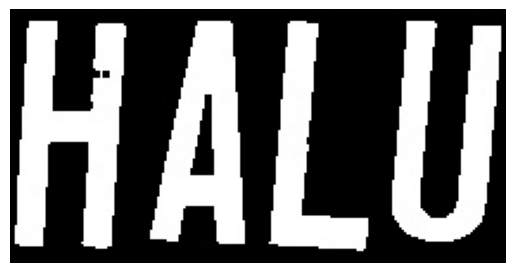

labeled_samples\142900001\1-142900001-OCR-LF-C01\1-142900001-OCR-LF-C01_reconst_0_class1.jpg: HALU


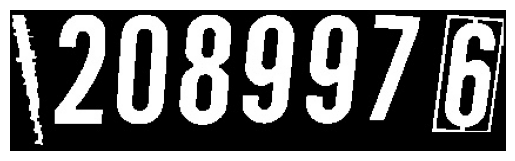

labeled_samples\142900001\1-142900001-OCR-LF-C01\1-142900001-OCR-LF-C01_reconst_1_class-1.jpg: \2089976


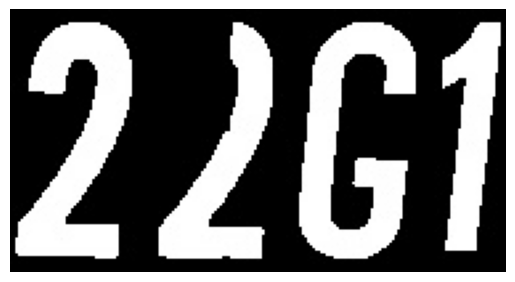

labeled_samples\142900001\1-142900001-OCR-LF-C01\1-142900001-OCR-LF-C01_reconst_2_class1.jpg: 2261


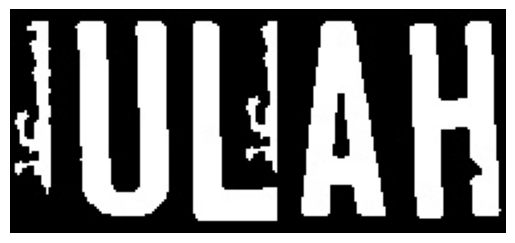

labeled_samples\142900001\1-142900001-OCR-RF-D01\1-142900001-OCR-RF-D01_reconst_0_class1.jpg: IULAH


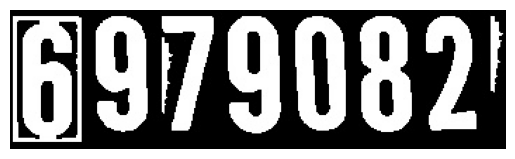

labeled_samples\142900001\1-142900001-OCR-RF-D01\1-142900001-OCR-RF-D01_reconst_1_class-1.jpg: 6979082!


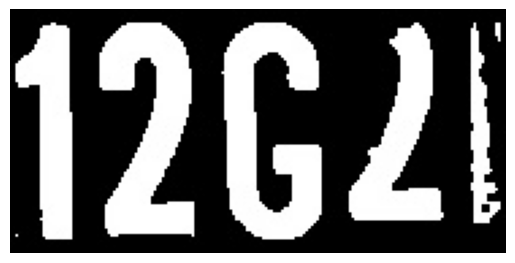

labeled_samples\142900001\1-142900001-OCR-RF-D01\1-142900001-OCR-RF-D01_reconst_2_class1.jpg: 1262!


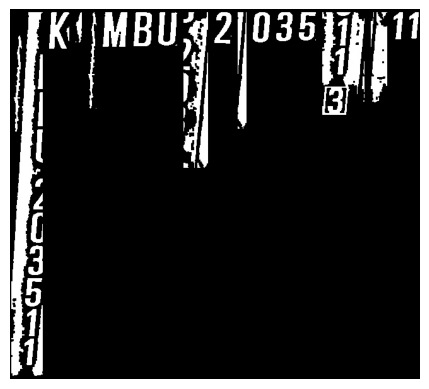

labeled_samples\144241001\1-144241001-OCR-AH-A01\1-144241001-OCR-AH-A01_reconst_0_class0.jpg: _


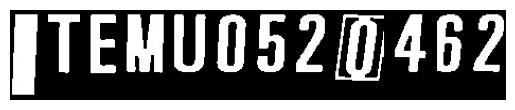

labeled_samples\144241001\1-144241001-OCR-AS-B01\1-144241001-OCR-AS-B01_reconst_0_class0.jpg: PTEMU0520/462


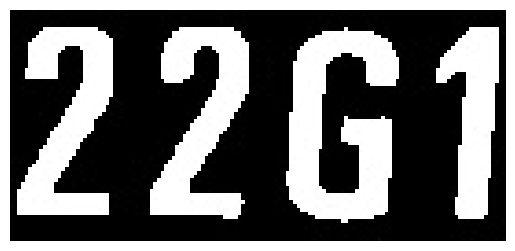

labeled_samples\144241001\1-144241001-OCR-AS-B01\1-144241001-OCR-AS-B01_reconst_1_class1.jpg: 2261


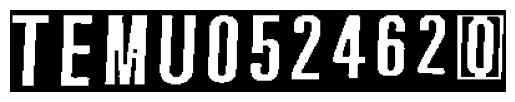

labeled_samples\144241001\1-144241001-OCR-LB-C02\1-144241001-OCR-LB-C02_reconst_0_class0.jpg: TEMU05246210


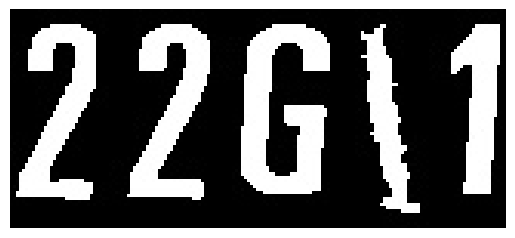

labeled_samples\144241001\1-144241001-OCR-LB-C02\1-144241001-OCR-LB-C02_reconst_1_class1.jpg: 226\1


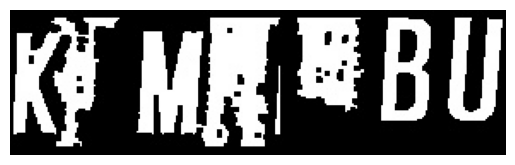

labeled_samples\144241001\1-144241001-OCR-LF-C01\1-144241001-OCR-LF-C01_reconst_0_class1.jpg: Kt MEE BU


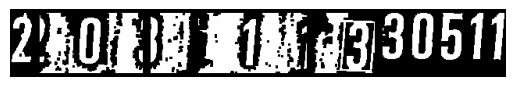

labeled_samples\144241001\1-144241001-OCR-LF-C01\1-144241001-OCR-LF-C01_reconst_1_class-1.jpg: 2B ORE MiB g330511


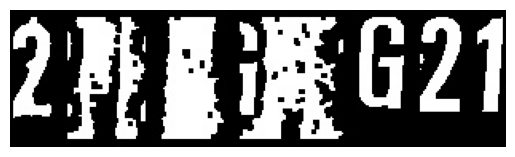

labeled_samples\144241001\1-144241001-OCR-LF-C01\1-144241001-OCR-LF-C01_reconst_2_class1.jpg: 2B Bip G21


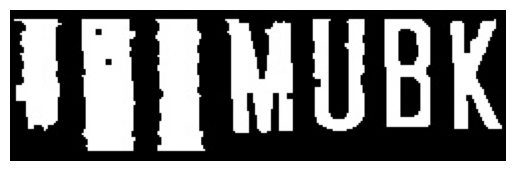

labeled_samples\144241001\1-144241001-OCR-RF-D01\1-144241001-OCR-RF-D01_reconst_0_class1.jpg: PPMUBK


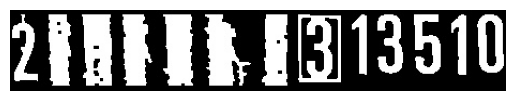

labeled_samples\144241001\1-144241001-OCR-RF-D01\1-144241001-OCR-RF-D01_reconst_1_class-1.jpg: 2RARE ER £9)13510


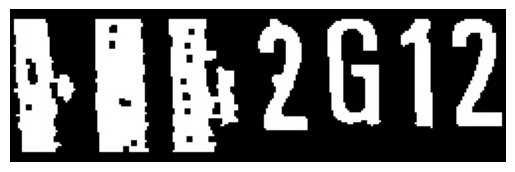

labeled_samples\144241001\1-144241001-OCR-RF-D01\1-144241001-OCR-RF-D01_reconst_2_class1.jpg: BAR 2012


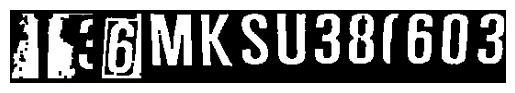

labeled_samples\145327001\1-145327001-OCR-AH-A01\1-145327001-OCR-AH-A01_reconst_0_class0.jpg: Abc GIMKSU38(603


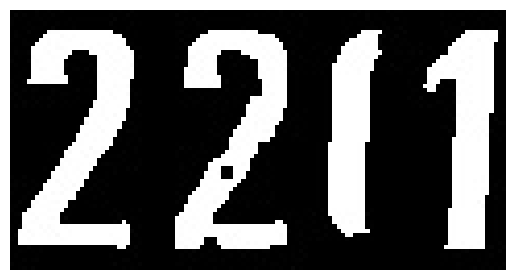

labeled_samples\145327001\1-145327001-OCR-AH-A01\1-145327001-OCR-AH-A01_reconst_1_class1.jpg: 2271


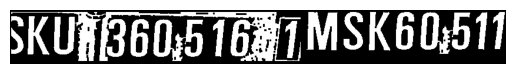

labeled_samples\145327001\1-145327001-OCR-AS-B01\1-145327001-OCR-AS-B01_reconst_0_class0.jpg: SKURB60:5 1624 7MSK60;511


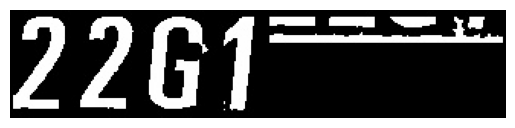

labeled_samples\145327001\1-145327001-OCR-AS-B01\1-145327001-OCR-AS-B01_reconst_1_class1.jpg: 22G1-


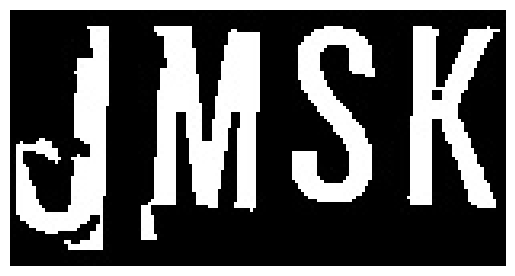

labeled_samples\145327001\1-145327001-OCR-LB-C02\1-145327001-OCR-LB-C02_reconst_0_class1.jpg: od MSK


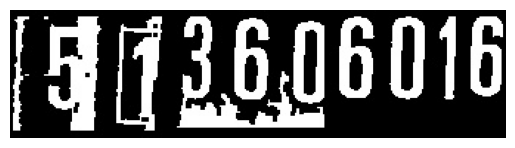

labeled_samples\145327001\1-145327001-OCR-LB-C02\1-145327001-OCR-LB-C02_reconst_1_class-1.jpg: | Ff 3.6.06 016


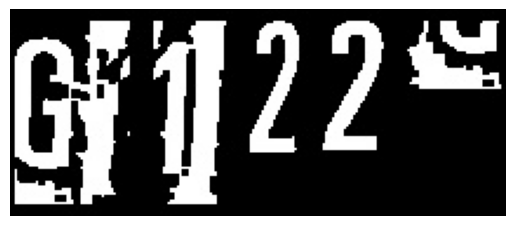

labeled_samples\145327001\1-145327001-OCR-LB-C02\1-145327001-OCR-LB-C02_reconst_2_class1.jpg: G22"


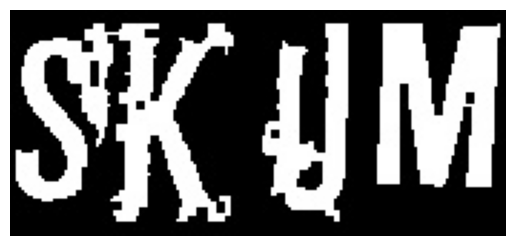

labeled_samples\145327001\1-145327001-OCR-LF-C01\1-145327001-OCR-LF-C01_reconst_0_class1.jpg: Sk YM


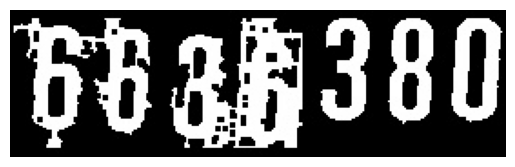

labeled_samples\145327001\1-145327001-OCR-LF-C01\1-145327001-OCR-LF-C01_reconst_1_class-1.jpg: BS 3380


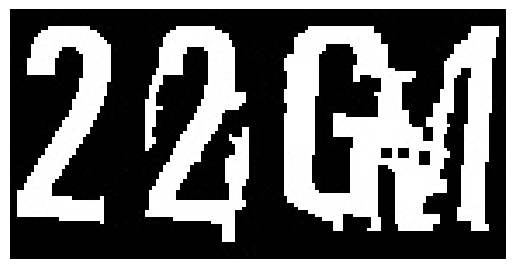

labeled_samples\145327001\1-145327001-OCR-LF-C01\1-145327001-OCR-LF-C01_reconst_2_class1.jpg: 22041


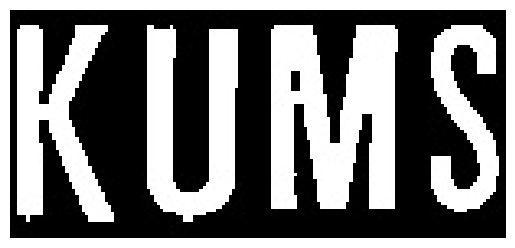

labeled_samples\145327001\1-145327001-OCR-RF-D01\1-145327001-OCR-RF-D01_reconst_0_class1.jpg: KUMS


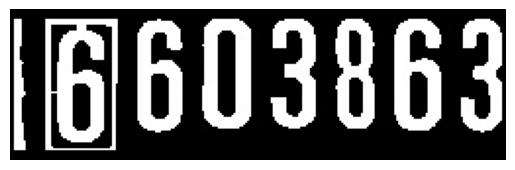

labeled_samples\145327001\1-145327001-OCR-RF-D01\1-145327001-OCR-RF-D01_reconst_1_class-1.jpg: (61603863


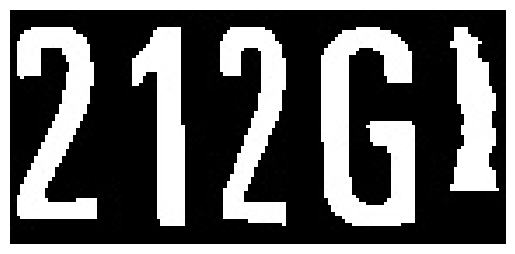

labeled_samples\145327001\1-145327001-OCR-RF-D01\1-145327001-OCR-RF-D01_reconst_2_class1.jpg: 212G)


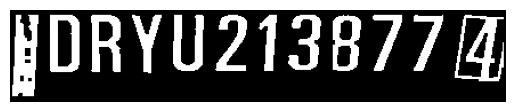

labeled_samples\150224001\1-150224001-OCR-AH-A01\1-150224001-OCR-AH-A01_reconst_0_class0.jpg: PDRYU213877 (4


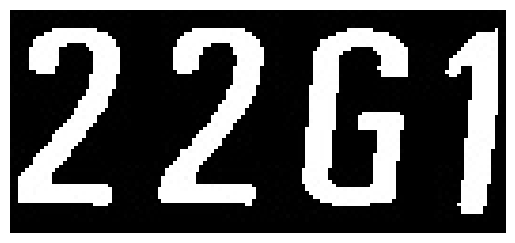

labeled_samples\150224001\1-150224001-OCR-AH-A01\1-150224001-OCR-AH-A01_reconst_1_class1.jpg: 2261


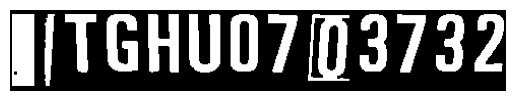

labeled_samples\150224001\1-150224001-OCR-AS-B01\1-150224001-OCR-AS-B01_reconst_0_class0.jpg: I] TGHUO7 (03732


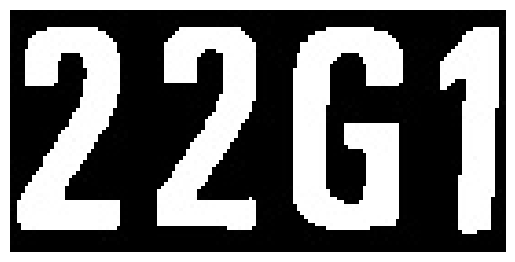

labeled_samples\150224001\1-150224001-OCR-AS-B01\1-150224001-OCR-AS-B01_reconst_1_class1.jpg: 22G1


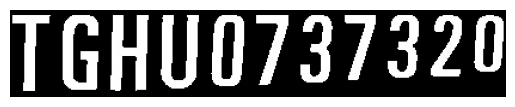

labeled_samples\150224001\1-150224001-OCR-LB-C02\1-150224001-OCR-LB-C02_reconst_0_class0.jpg: TGHU0737320


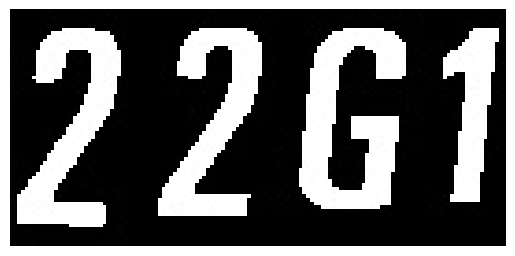

labeled_samples\150224001\1-150224001-OCR-LB-C02\1-150224001-OCR-LB-C02_reconst_1_class1.jpg: 2261


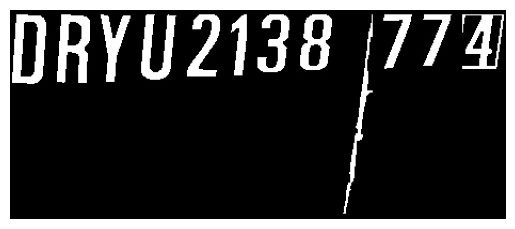

labeled_samples\150224001\1-150224001-OCR-LF-C01\1-150224001-OCR-LF-C01_reconst_0_class0.jpg: mee


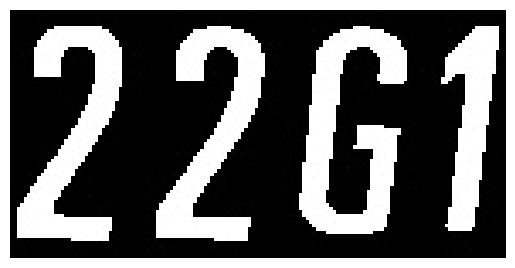

labeled_samples\150224001\1-150224001-OCR-LF-C01\1-150224001-OCR-LF-C01_reconst_1_class1.jpg: 2261


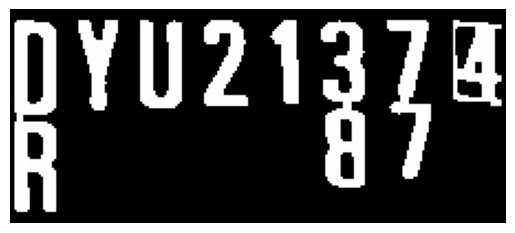

labeled_samples\150224001\1-150224001-OCR-RF-D01\1-150224001-OCR-RF-D01_reconst_0_class0.jpg: pvU2t3 74


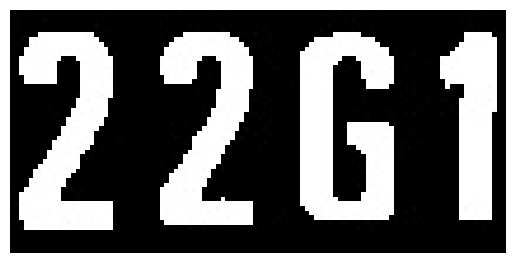

labeled_samples\150224001\1-150224001-OCR-RF-D01\1-150224001-OCR-RF-D01_reconst_1_class1.jpg: 2261


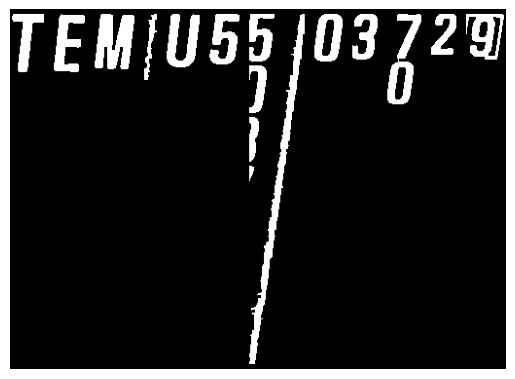

labeled_samples\152733001\1-152733001-OCR-AH-A01\1-152733001-OCR-AH-A01_reconst_0_class0.jpg: a


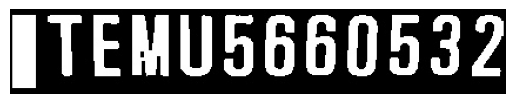

labeled_samples\152733001\1-152733001-OCR-AS-B01\1-152733001-OCR-AS-B01_reconst_0_class0.jpg: PTEMU5660532


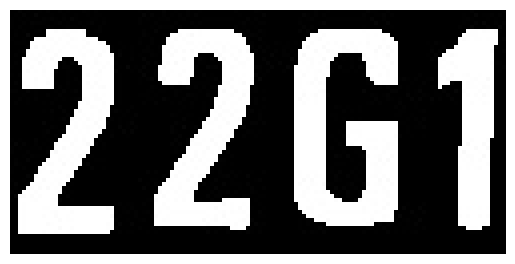

labeled_samples\152733001\1-152733001-OCR-AS-B01\1-152733001-OCR-AS-B01_reconst_1_class1.jpg: 22G1


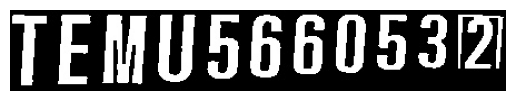

labeled_samples\152733001\1-152733001-OCR-LB-C02\1-152733001-OCR-LB-C02_reconst_0_class0.jpg: TEMU566053122)


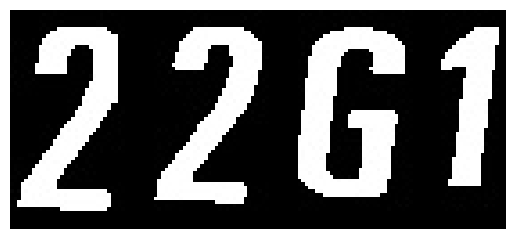

labeled_samples\152733001\1-152733001-OCR-LB-C02\1-152733001-OCR-LB-C02_reconst_1_class1.jpg: 2261


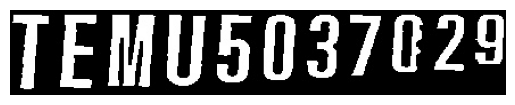

labeled_samples\152733001\1-152733001-OCR-LF-C01\1-152733001-OCR-LF-C01_reconst_0_class0.jpg: TEMU5037029


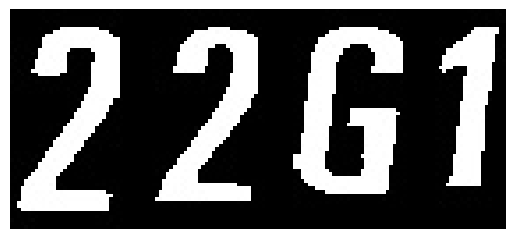

labeled_samples\152733001\1-152733001-OCR-LF-C01\1-152733001-OCR-LF-C01_reconst_1_class1.jpg: 2261


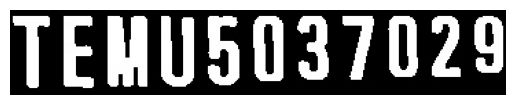

labeled_samples\152733001\1-152733001-OCR-RF-D01\1-152733001-OCR-RF-D01_reconst_0_class0.jpg: TEMU5037029


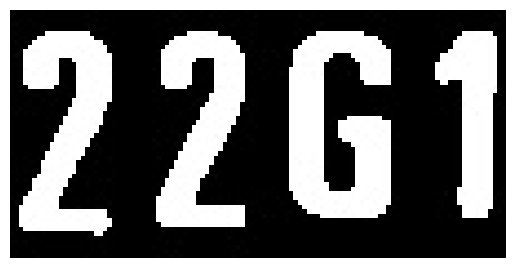

labeled_samples\152733001\1-152733001-OCR-RF-D01\1-152733001-OCR-RF-D01_reconst_1_class1.jpg: 22G1


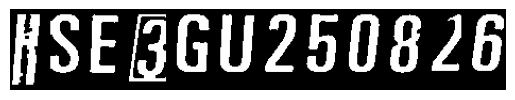

labeled_samples\153458001\1-153458001-OCR-AH-A01\1-153458001-OCR-AH-A01_reconst_0_class0.jpg: A#SEGGU2508 26


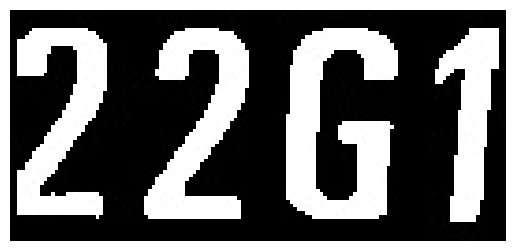

labeled_samples\153458001\1-153458001-OCR-AH-A01\1-153458001-OCR-AH-A01_reconst_1_class1.jpg: 22G1


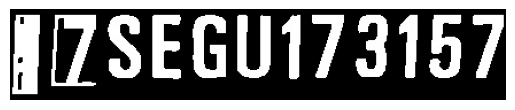

labeled_samples\153458001\1-153458001-OCR-AS-B01\1-153458001-OCR-AS-B01_reconst_0_class0.jpg: AI7SEGU173157


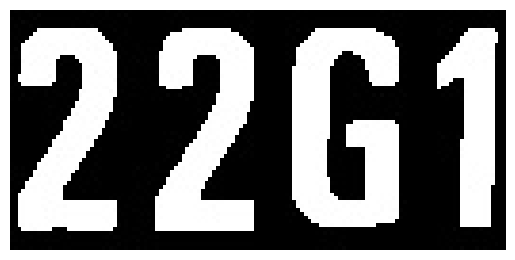

labeled_samples\153458001\1-153458001-OCR-AS-B01\1-153458001-OCR-AS-B01_reconst_1_class1.jpg: 22G1


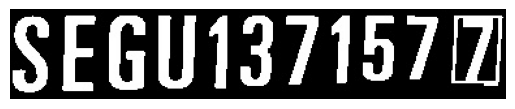

labeled_samples\153458001\1-153458001-OCR-LB-C02\1-153458001-OCR-LB-C02_reconst_0_class0.jpg: SEGU137157/7


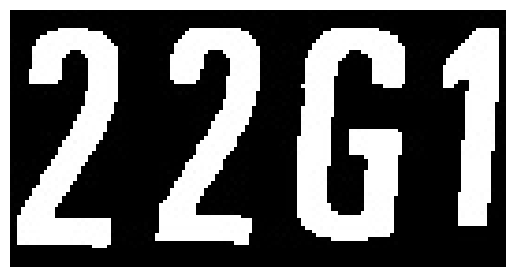

labeled_samples\153458001\1-153458001-OCR-LB-C02\1-153458001-OCR-LB-C02_reconst_1_class1.jpg: 22G1


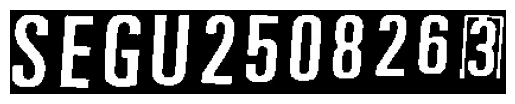

labeled_samples\153458001\1-153458001-OCR-LF-C01\1-153458001-OCR-LF-C01_reconst_0_class0.jpg: SEGU2508263


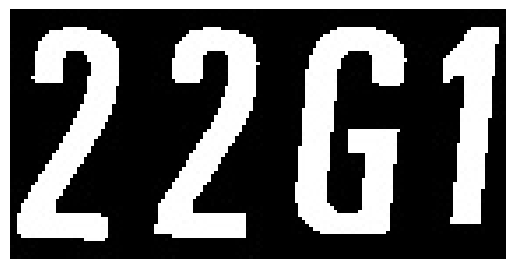

labeled_samples\153458001\1-153458001-OCR-LF-C01\1-153458001-OCR-LF-C01_reconst_1_class1.jpg: 2261


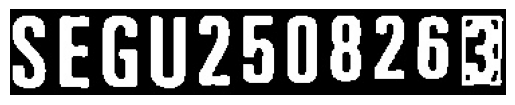

labeled_samples\153458001\1-153458001-OCR-RF-D01\1-153458001-OCR-RF-D01_reconst_0_class0.jpg: SEGU2508268


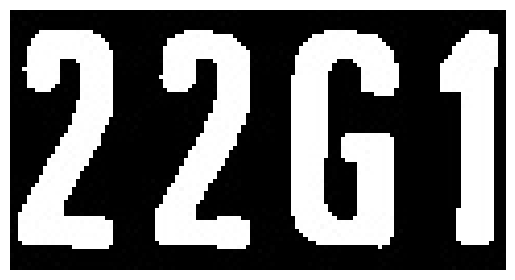

labeled_samples\153458001\1-153458001-OCR-RF-D01\1-153458001-OCR-RF-D01_reconst_1_class1.jpg: 22G1


In [22]:
# Use pytesseract to extract text from the reconstituted images
import os
import pytesseract
import cv2

def extract_text_from_reconstituted_images(labeled_samples_dir="labeled_samples"):
    """
    Traverse all subfolders and extract text from reconstituted images using pytesseract.
    Prints the filename and the extracted text.
    """
    for img_id in os.listdir(labeled_samples_dir):
        id_folder = os.path.join(labeled_samples_dir, img_id)
        if not os.path.isdir(id_folder):
            continue
        for labeled_image_subfolder in os.listdir(id_folder):
            subfolder_path = os.path.join(id_folder, labeled_image_subfolder)
            if not os.path.isdir(subfolder_path):
                continue
            for file in os.listdir(subfolder_path):
                if file.endswith('.jpg') and '_reconst_' in file:
                    img_path = os.path.join(subfolder_path, file)
                    img = cv2.imread(img_path)
                    if img is None:
                        print(f"Warning: Could not read image {img_path}")
                        continue
                    # Convert to grayscale for better OCR
                    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                    # Optional: thresholding can help
                    # _, gray = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
                    text = pytesseract.image_to_string(gray, config='--psm 7')
                    # Plot the image (optional)
                    plt.imshow(gray, cmap='gray')
                    plt.axis('off')
                    plt.show()
                    print(f"{img_path}: {text.strip()}")

# Example usage:
extract_text_from_reconstituted_images("labeled_samples")

In [23]:
import os
import cv2
import pytesseract
import matplotlib.pyplot as plt

# EasyOCR
import easyocr
easyocr_reader = easyocr.Reader(['en'], gpu=False)

# TrOCR
from transformers import TrOCRProcessor, VisionEncoderDecoderModel
import torch
from PIL import Image

trocr_processor = TrOCRProcessor.from_pretrained('microsoft/trocr-base-handwritten')
trocr_model = VisionEncoderDecoderModel.from_pretrained('microsoft/trocr-base-handwritten')

# PaddleOCR
from paddleocr import PaddleOCR
paddle_ocr = PaddleOCR(use_angle_cls=True, lang='en', show_log=False)

def run_trocr(img):
    pil_img = Image.fromarray(img)
    pixel_values = trocr_processor(images=pil_img, return_tensors="pt").pixel_values
    generated_ids = trocr_model.generate(pixel_values)
    generated_text = trocr_processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return generated_text.strip()

def run_easyocr(img):
    result = easyocr_reader.readtext(img)
    return ' '.join([r[1] for r in result])

def run_paddleocr(img):
    result = paddle_ocr.ocr(img)
    if result and len(result[0]) > 0:
        return ' '.join([line[1][0] for line in result[0]])
    return ''

def compare_ocr_on_reconstituted_images(labeled_samples_dir="labeled_samples"):
    """
    Compare pytesseract, EasyOCR, TrOCR, and PaddleOCR on reconstituted images.
    """
    for img_id in os.listdir(labeled_samples_dir):
        id_folder = os.path.join(labeled_samples_dir, img_id)
        if not os.path.isdir(id_folder):
            continue
        for labeled_image_subfolder in os.listdir(id_folder):
            subfolder_path = os.path.join(id_folder, labeled_image_subfolder)
            if not os.path.isdir(subfolder_path):
                continue
            for file in os.listdir(subfolder_path):
                if file.endswith('.jpg') and '_reconst_' in file:
                    img_path = os.path.join(subfolder_path, file)
                    img = cv2.imread(img_path)
                    if img is None:
                        print(f"Warning: Could not read image {img_path}")
                        continue
                    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                    # Tesseract
                    tess_text = pytesseract.image_to_string(gray, config='--psm 7').strip()
                    # EasyOCR
                    easy_text = run_easyocr(gray)
                    # TrOCR
                    trocr_text = run_trocr(gray)
                    # PaddleOCR
                    paddle_text = run_paddleocr(gray)
                    # Show image and results
                    plt.imshow(gray, cmap='gray')
                    plt.axis('off')
                    plt.title(file)
                    plt.show()
                    print(f"File: {img_path}")
                    print(f"  Tesseract:  {tess_text}")
                    print(f"  EasyOCR:    {easy_text}")
                    print(f"  TrOCR:      {trocr_text}")
                    print(f"  PaddleOCR:  {paddle_text}")
                    print("-" * 60)

# Example usage:
compare_ocr_on_reconstituted_images("labeled_samples")

[2025-07-02 14:40:59,816] [ WARNING] easyocr.py:71 - Using CPU. Note: This module is much faster with a GPU.


KeyboardInterrupt: 